# Vivino Wine Recommender

***

# Notebook 5: Modeling

&nbsp;

**By: Annika Scholl**

**BrainStation Data Science**

The aim of this notebook is to build a content-based recommendation system. Firstly, clusters based on wine taste and flavors are examined using K-means and hierarchical clustering. Finally, multiple recommendation systems are built using cosine similarity and KNN based on different feature selections (taste, food, and/or flavor). Ultimately, the findings of the different recommendation systems are compared.

***

## Notebook Contents

1. [**Loading Data & Libraries**](#a1)<br>
    3.1. [Features and Scaling](#a1.1)<br>

2. [**Clustering**](#a2)<br>
    2.1. [PCA](#a2.1)<br>
    2.2. [K-means Clustering](#a2.2)<br>
    2.3. [Hierarchical Clustering](#a2.3)<br>
    2.4. [Comparing Clusters](#a2.4)<br>
    
2. [**Recommendation System**](#a3)<br>
    3.1. [Cosine Similarity](#a3.1)<br>
    3.2. [KNN](#a3.2)<br>
    3.3. [Comparison](#a3.3)<br>
        
3. [**Conclusion**](#a4)<br>

4. [**Appendix**](#a5)<br>
    4.1. [Taste Clustering](#a3.1)<br>
    4.2. [More Recommender](#a3.2)<br>

***

# Loading Data and Libraries <a id="a1"></a>

In [1]:
# import libraries
import numpy as np
import pandas as pd

# plotting
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio

# sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.decomposition import PCA

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors


In [2]:
# Figure settings matplotlib
plt.style.use('dark_background')
plt.rcParams["figure.figsize"] = (8,3)
plt.rcParams["figure.dpi"] = 300

In [3]:
# Figure settings plotly
px.defaults.width = 800
px.defaults.height = 600
px.defaults.template = "plotly_dark"

In [4]:
# Df clean 
df = pd.read_csv(f'data/data_clean.csv', index_col=0)

In [5]:
# Features for Recommendation
feature_final = pd.read_csv(f'data/feature_final.csv', index_col=0)

In [6]:
# DF with all features
df_complete = feature_final.iloc[:,5:].join(df, how="inner")

## Features and Scaling

First, I am going to scale the features and split them into subgroups of taste, food, flavor group, flavor subgroup and feature select (taste+food+flavor group). 

In [7]:
# Feature Scaling
my_scaler = StandardScaler()

X = my_scaler.fit_transform(feature_final)
feature_scaled = pd.DataFrame(data=X, columns=feature_final.columns, index=feature_final.index)

In [8]:
# Feature Selection
taste = feature_scaled.iloc[:,:5]
flavor_group = feature_scaled.iloc[:,5:18]
flavor_subgroup = feature_scaled.iloc[:,18:-16]
all_flavor = feature_scaled.iloc[:,5:-16]

food = feature_scaled.iloc[:,-16:]

taste_flavor_group = feature_scaled.iloc[:,:18]

In [9]:
print('Number of Features:')
print(f' All Features: {feature_scaled.shape[1]}')
print(f' Taste: {taste.shape[1]}')
print(f' Food: {food.shape[1]}')
print(f' Flavor_group: {flavor_group.shape[1]}')
print(f' Flavor_subgroup: {flavor_subgroup.shape[1]}')

Number of Features:
 All Features: 489
 Taste: 5
 Food: 16
 Flavor_group: 13
 Flavor_subgroup: 455


***

# Clustering <a id="a2"></a>

Before delving into recommendation systems, I am analysing clusters to identify any existing group structures in the data. To visualise potential clusters, I am utilising principal components. My focus is on the taste and flavor group characteristics for the clustering process.

## PCA 

In [10]:
# instantiate PCA
pca = PCA()

# fit + transform
pca_data = pca.fit_transform(taste_flavor_group)
# create dataframe for PC transformed scaled data
pca_df = pd.DataFrame(pca_data)

In [11]:
# viewing share of explained variance by principal component
ex_var_ratio = pca.explained_variance_ratio_
ex_var_ratio.cumsum()

array([0.20267902, 0.32047249, 0.4025897 , 0.47334208, 0.54069625,
       0.5999938 , 0.65234682, 0.70390044, 0.75263686, 0.80037118,
       0.84340943, 0.88532469, 0.92461883, 0.9533059 , 0.97868881,
       0.99176255, 1.        , 1.        ])

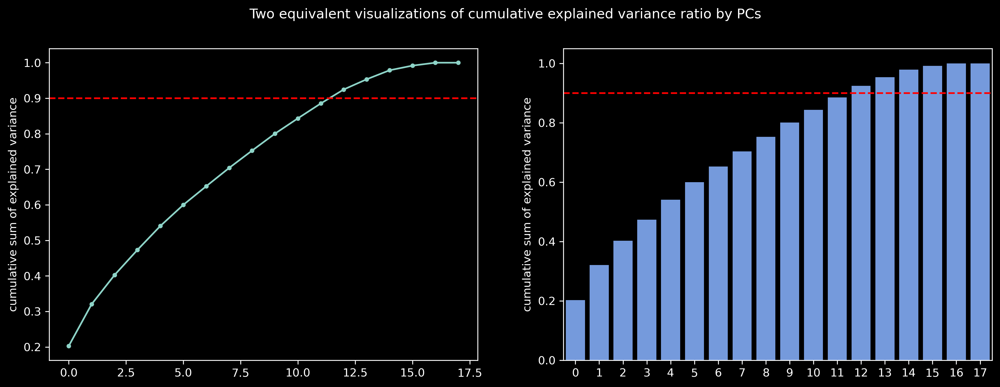

In [12]:
# Visualising 
plt.style.use('dark_background')
plt.subplots(1,2,figsize=(15,5))
plt.suptitle("Two equivalent visualizations of cumulative explained variance ratio by PCs")

# scree plot - visualizing cumulative variance captured
plt.subplot(1,2,1)
plt.plot(pca_df.columns, ex_var_ratio.cumsum(), marker='.')
plt.axhline(0.9, color='red', linestyle='--')

plt.ylabel('cumulative sum of explained variance')

plt.subplot(1,2,2)
sns.barplot(x=pca_df.columns, y=ex_var_ratio.cumsum(), color='cornflowerblue')
plt.axhline(0.9, color='red', linestyle='--')

plt.ylabel('cumulative sum of explained variance')

plt.show()

**Key Findings:**
- The PCA graph indicates that 18 PCs are required to represent 90% of the data. However, for visualization purposes, only 4 PCs will be used in the following. 

In [13]:
#Extract first 4 principal components
pca = PCA(n_components = 4)
pca_data = pca.fit_transform(taste_flavor_group)

# create dataframe for PC transformed scaled data
pca_df = pd.DataFrame(pca_data)
pca_df.head()

,0,1,2,3
0,0.927749,0.944816,0.207054,-1.194642
1,-1.944964,0.861581,-1.782623,0.495778
2,-2.112431,1.497624,-0.551014,0.256253
3,-2.683384,2.343902,-2.497729,0.654848
4,-0.371613,0.089046,-0.665002,-0.148445


/opt/anaconda3/envs/vivino/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


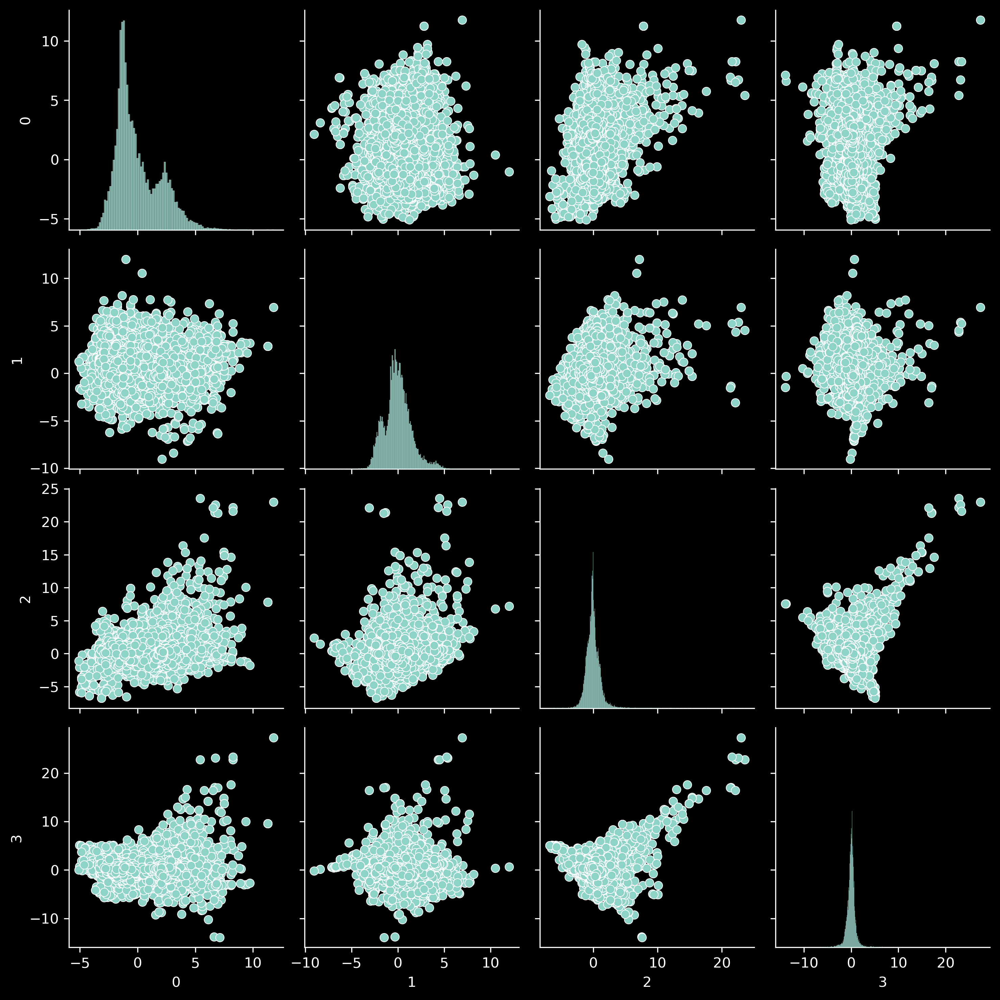

In [14]:
# Visualising
sns.pairplot(pca_df)
plt.show()

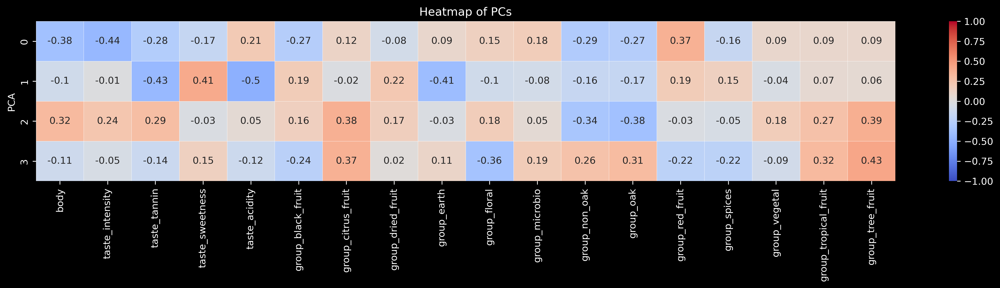

In [15]:
# heatmap correlation matrix between original features and principal components
plt.figure(figsize=(20,3))

sns.heatmap(np.round(pca.components_,2),
            annot=True,
            xticklabels=taste_flavor_group.columns[0:18],
            yticklabels=pca_df.columns,
            linewidths=0.2,
            vmin=-1,
            vmax=1,
            cmap='coolwarm')

plt.ylabel("PCA")
plt.xticks(rotation=90)
plt.yticks(rotation=90)
plt.title('Heatmap of PCs')

plt.show()

**Key Findings:**
- The PC heatmap shows that most features are not well represented in the PCs.  
- In PCA 0, taste intensity and body are mostly represented in the negative direction, while group red fruit is represented positively.  
- In PCA 1, taste intensity, taste acidity, and group earth are represented negatively, while taste sweetness is represented positively.  
- In PCA 2, group non-oak and oak are represented negatively, while group citrus fruit, tree fruit, and body are represented positively.  
- In PCA 3, group floral is represented negatively, while group citrus fruit, oak, tropical fruit, and tree fruit are represented positively.



## K-means Clustering

In [16]:
# Define values for k
ks = np.arange(2, 10)

# Create empty lists to save inertia and silhouette scores
inertia = []
silhouette_scores_kmeans = []

# Loop through different values of k
for k in ks:

  # Instantiate model
  my_kmeans = KMeans(n_clusters = k)

  # Fit (+get y labels)
  y_labels_kmeans = my_kmeans.fit_predict(taste_flavor_group)

  # Extract inertia
  inertia.append(my_kmeans.inertia_)

  # Extract silhouette score
  silhouette = silhouette_score(taste_flavor_group, y_labels_kmeans)
  silhouette_scores_kmeans.append(silhouette)

  # Update progress
  print(f'Computed score for k={k}')

Computed score for k=2
Computed score for k=3
Computed score for k=4
Computed score for k=5
Computed score for k=6
Computed score for k=7
Computed score for k=8
Computed score for k=9


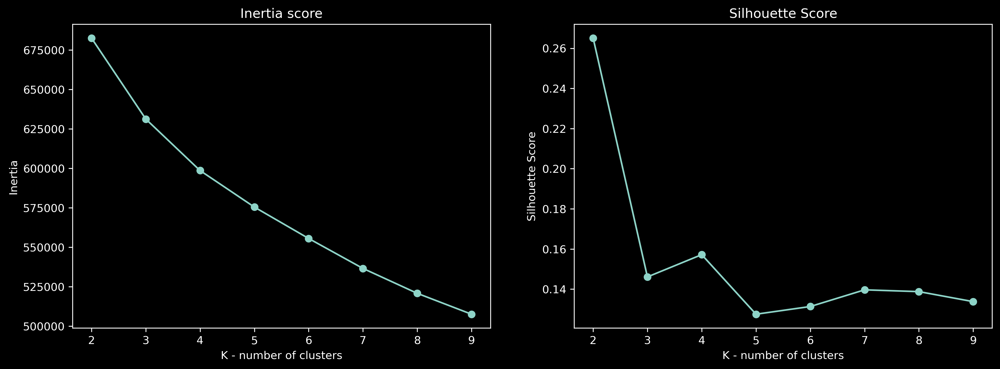

In [17]:
# Visulaise scores
plt.subplots(1,2,
             figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(ks, inertia, marker='o')
plt.xlabel('K - number of clusters')
plt.ylabel('Inertia')
plt.title('Inertia score')

plt.subplot(1,2,2)
plt.plot(ks, silhouette_scores_kmeans, marker='o')
plt.xlabel('K - number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')

plt.show()

**Key Findings:**
- The inertia score does not have an elbow shape.  
- The silhouette score is the highest with 2 clusters.  
- Therefore, I will choose 2 clusters.

In [18]:
# Fit final model
kmeans = KMeans(n_clusters = 2)
kmeans_y_labels = kmeans.fit_predict(taste_flavor_group)

# Add labels 
df_kmeans = taste_flavor_group.copy()
df_kmeans['kmeans_labels'] = kmeans_y_labels

In [19]:
def pca_visualise(result_df):

   """

    Function to visualise the clusters in the pca.

    Input:
    model: df with labels

    Returns:
    Displays PCs with clusters in different colors.

   """

   # Extract clustering column name
   column_names = result_df.columns
   label_column = column_names[column_names.str.contains('_labels')][0]

   #Extract first 4 principal components
   pca = PCA(n_components = 4)
   pca_data = pca.fit_transform(result_df.drop(label_column, axis=1))

   # create dataframe for PC transformed scaled data
   pca_df = pd.DataFrame(pca_data)
   pca_df[label_column] = result_df[label_column].values

   # Visualise
   sns.pairplot(pca_df, hue=label_column)
   plt.show()

/opt/anaconda3/envs/vivino/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


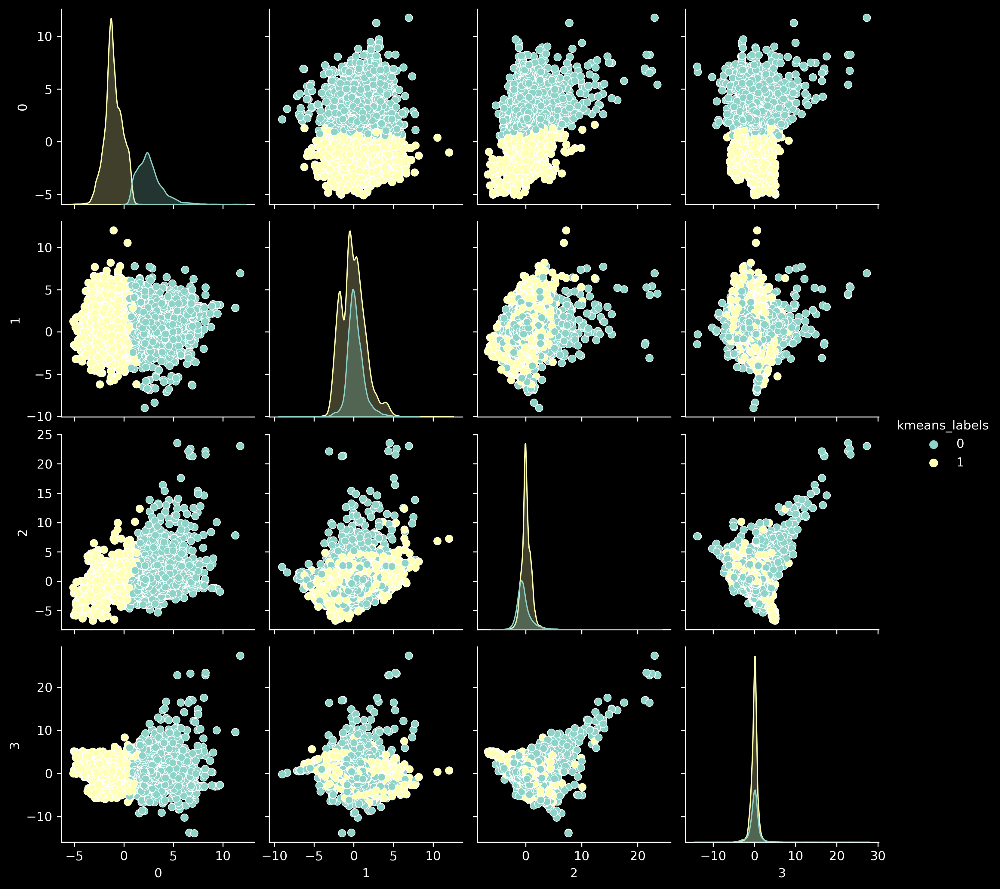

In [20]:
pca_visualise(df_kmeans)

**Key Findings**:

- At PCA 0, the clusters are distinguishable from each other and there is a clear line between two clusters. However, in the other PCs, there is not such a clear separation.

## Hierarchical Clustering

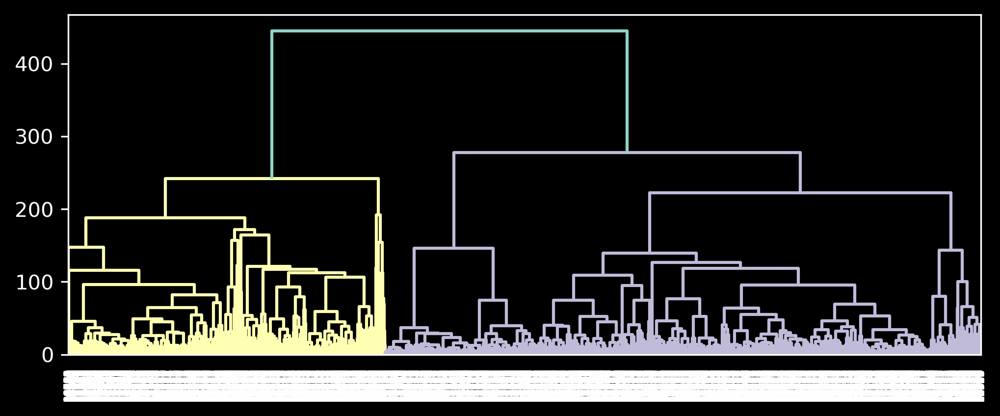

In [21]:
# Visualize dendrogram

linkage_mat = linkage(taste_flavor_group, 'ward')

# Plot
plt.figure()
dendrogram(linkage_mat)
plt.title("Dendrogram")
plt.show()


In [22]:
# Define values for k
ks = np.arange(2, 10)

# Create emptys list to save silhouette scores
silhouette_scores_hclust = []

# Loop thtough different values of k
for k in ks:

  # Instantiate
  my_hclust = AgglomerativeClustering(n_clusters=k, linkage='ward')

  # Fit
  y_labels = my_hclust.fit_predict(taste_flavor_group)

  # Append silhouette
  silhouette = silhouette_score(taste_flavor_group, y_labels)
  silhouette_scores_hclust.append(silhouette)

  # Update progress
  print(f'Computed Score for k={k}')


Computed Score for k=2
Computed Score for k=3
Computed Score for k=4
Computed Score for k=5
Computed Score for k=6
Computed Score for k=7
Computed Score for k=8
Computed Score for k=9
Computed Score for k=10
Computed Score for k=11
Computed Score for k=12
Computed Score for k=13
Computed Score for k=14
Computed Score for k=15
Computed Score for k=16
Computed Score for k=17
Computed Score for k=18
Computed Score for k=19
Computed Score for k=20


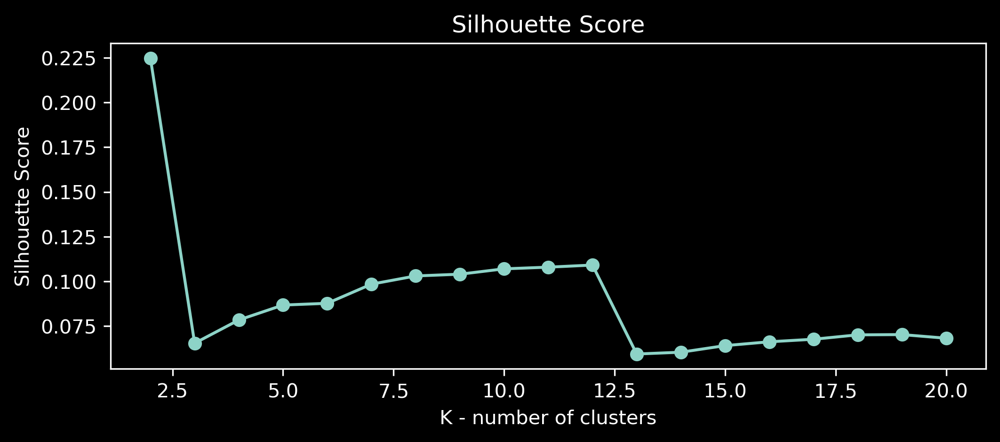

In [23]:
# Visualise silhouette scores
plt.figure()

plt.plot(ks, silhouette_scores_hclust, marker='o')
plt.xlabel('K - number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()

**Key FIndings:**
- The silhoeutte score is the highest at 2 clusters.  

In [24]:
# Fit final model
hclust = AgglomerativeClustering(n_clusters = 2, linkage='ward')
hclust_y_labels = hclust.fit_predict(taste_flavor_group)

# Add labels 
df_hclust = taste_flavor_group.copy()
df_hclust['hclust_labels'] = hclust_y_labels

/opt/anaconda3/envs/vivino/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


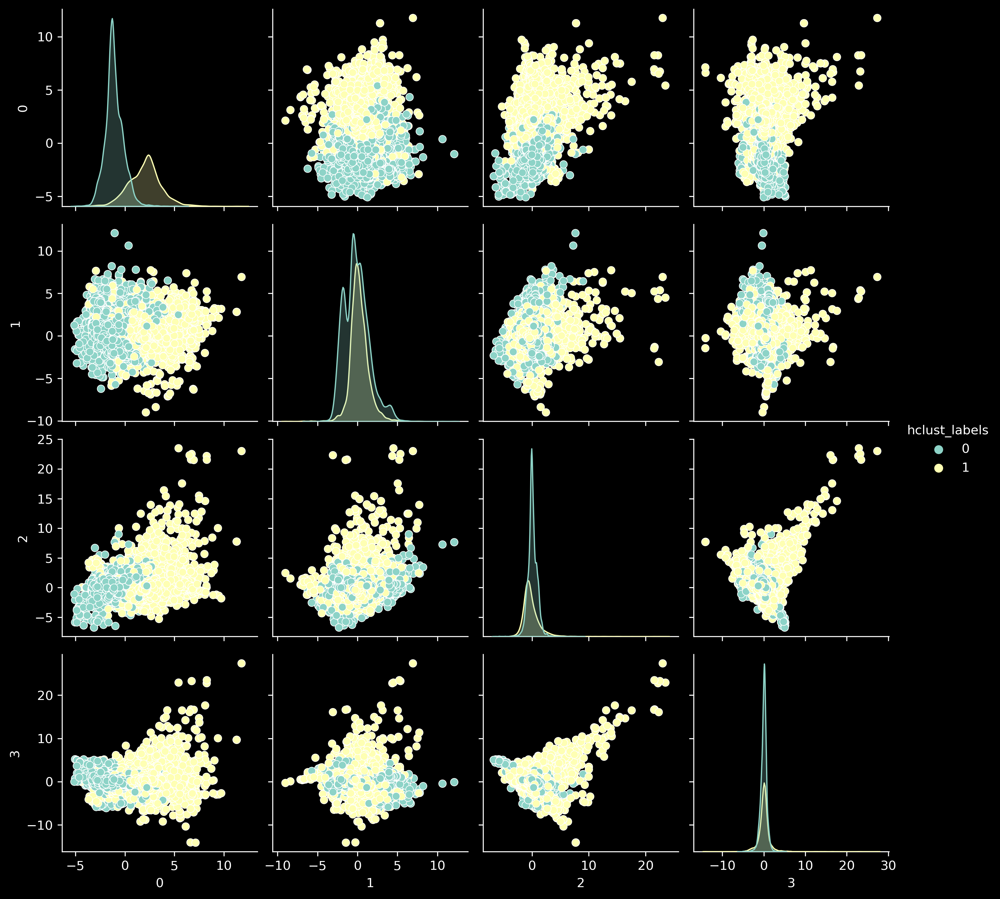

In [25]:
# Visualise
pca_visualise(df_hclust)

**Key Findings:**

- The hierarchical clusters are less separated from each other compared to the k-means clusters. 
- However, like k-means, PC0 shows the most separation out of the principal components.

## Comparing Clusters

In [26]:
# Adding clusters to df
cluster_final = taste_flavor_group.copy()
cluster_final['kmeans_labels'] = kmeans_y_labels
cluster_final['hclust_labels'] = hclust_y_labels
cluster_final.head()

,body,taste_intensity,taste_tannin,taste_sweetness,taste_acidity,group_black_fruit,group_citrus_fruit,group_dried_fruit,group_earth,group_floral,group_microbio,group_non_oak,group_oak,group_red_fruit,group_spices,group_vegetal,group_tropical_fruit,group_tree_fruit,kmeans_labels,hclust_labels
index,,,,,,,,,,,,,,,,,,,,
6247930_2020,0.272886,-0.144758,-0.429047,-0.559055,-0.622729,-0.278890,-0.400100,0.261284,-0.535084,0.095284,-0.311080,-0.316313,-1.144547,1.462495,-0.049869,0.548671,-0.188962,-0.29134,0,1
4902052_2018,0.272886,0.015137,-0.815327,0.042864,-0.847623,0.981568,-0.400100,-0.805650,-1.058874,-0.859305,-1.046962,1.079333,1.641904,-0.704441,0.491652,-0.724780,-0.188962,-0.29134,1,0
1202271_2015,0.272886,1.510288,0.183329,0.050163,-1.195402,-0.657332,0.152534,1.023379,-2.122207,-0.859305,-0.416206,1.424735,0.618310,0.333503,1.448984,-0.179015,-0.188962,-0.29134,1,0
7212283_2022,0.272886,1.478467,-0.563855,0.964324,-2.240406,-1.934576,-0.400100,-0.805650,-2.671595,-0.859305,-1.046962,3.187546,0.948845,0.869774,2.966572,-0.724780,-0.188962,-0.29134,1,0
1551777_2018,0.272886,0.248908,-0.470862,-1.127822,-0.529193,0.433055,-0.400100,-0.112143,-0.449624,-0.238822,-0.090315,0.216883,0.519149,0.270468,-0.613812,-0.724780,-0.188962,-0.29134,1,1


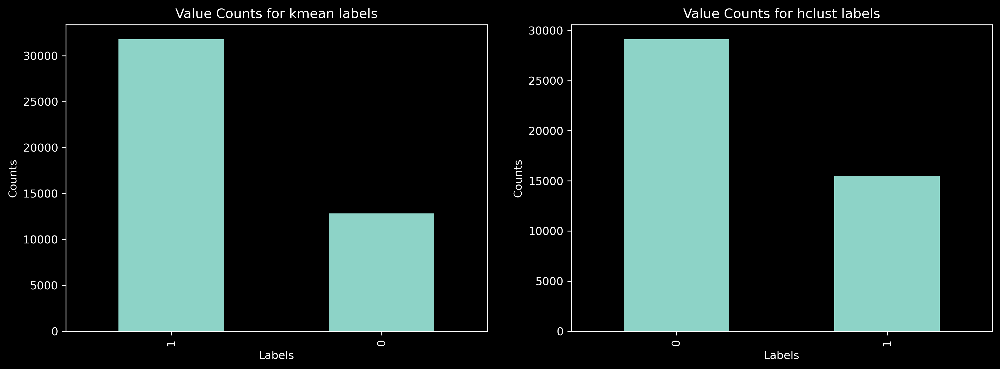

In [27]:
# Visualise number of clusters
plt.subplots(1,2, figsize=(15,5))

plt.subplot(1,2,1)
cluster_final['kmeans_labels'].value_counts().sort_values(ascending= False).plot(kind='bar')
plt.ylabel('Counts')
plt.xlabel('Labels')
plt.title('Value Counts for kmean labels')

plt.subplot(1,2,2)
cluster_final['hclust_labels'].value_counts().sort_values(ascending= False).plot(kind='bar')
plt.ylabel('Counts')
plt.xlabel('Labels')
plt.title('Value Counts for hclust labels')

plt.show()


**Key Findings:**
- The graph depicting value count indicates that one cluster is more prevalent than the other. Additionally, K-means clsuters are more imbalanced than the hierarchical clusters.

In [31]:
# Compare cluster 1 and cluster 0 
relative_means_kmeans = cluster_final.groupby('kmeans_labels').mean()

# Melt dataframe for vizualisation
melted_relative_means_kmeans = relative_means_kmeans.reset_index().melt(id_vars='kmeans_labels')

cond = melted_relative_means_kmeans['variable'] != 'hclust_labels'

# Sort by variable and value
melted_relative_means_kmeans = melted_relative_means_kmeans[cond].sort_values(by=['value', 'variable'])



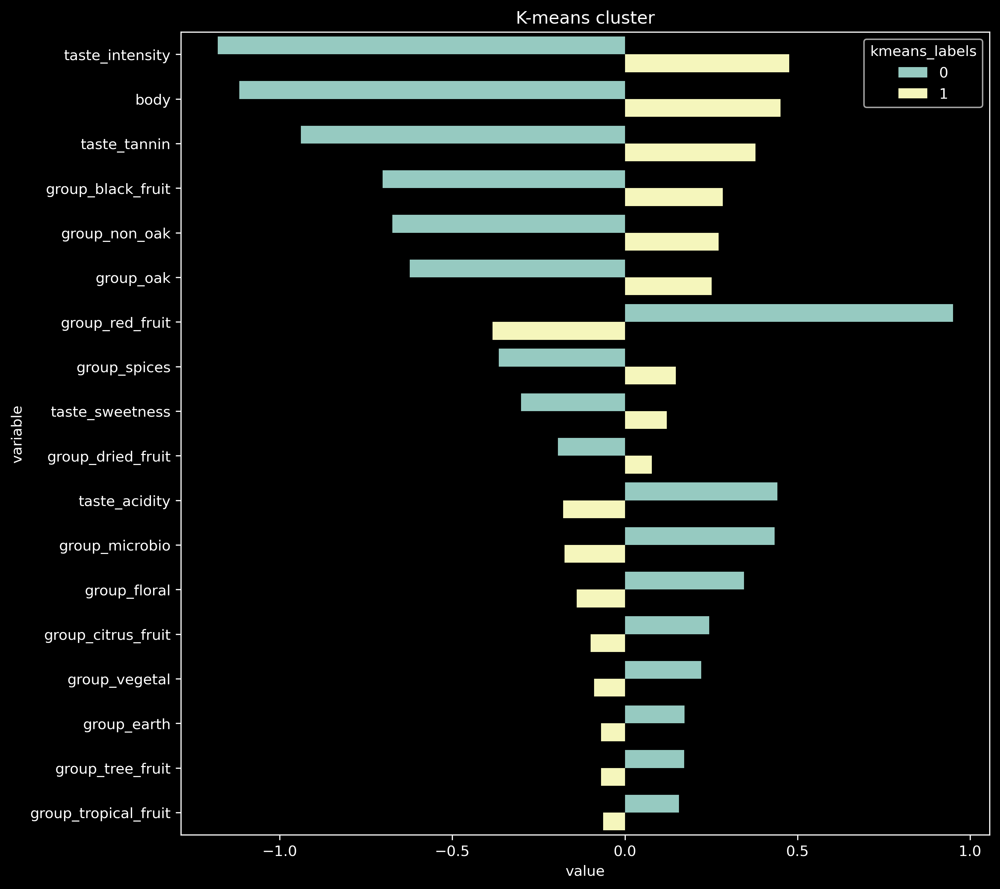

In [35]:
# Visualise
plt.figure(figsize=(10,10))

sns.barplot(x="value", y="variable", hue='kmeans_labels',
            data = melted_relative_means_kmeans)
plt.title('K-means cluster')

plt.show()

**Key Findings:**
- When comparing the two clusters, all taste and flavor features are pointing in opposite directions. This means that for one label, the value is above the average, and for the other label, it is below the average, since the data is scaled. For example, the average of 'taste_intensity' for label 0 is -1 (below the average distribution of intensity in total), and for label 1, it is around 0.5 (above average). The taste and group flavors are clear indicators of the clusters. 
- In the appendix, there is another clustering that only considers taste features, resulting in two clusters.

In [33]:
# Compare cluster 1 and cluster 0 (remember our data is standardized!)
relative_means_hclust = cluster_final.groupby('hclust_labels').mean()

# Melt dataframe for vizualisation
melted_relative_means_hclust = relative_means_hclust.reset_index().melt(id_vars='hclust_labels')

cond = melted_relative_means_hclust['variable'] != 'kmeans_labels'

# Sort by value
melted_relative_means_hclust = melted_relative_means_hclust[cond].sort_values(by=['value', 'variable'])

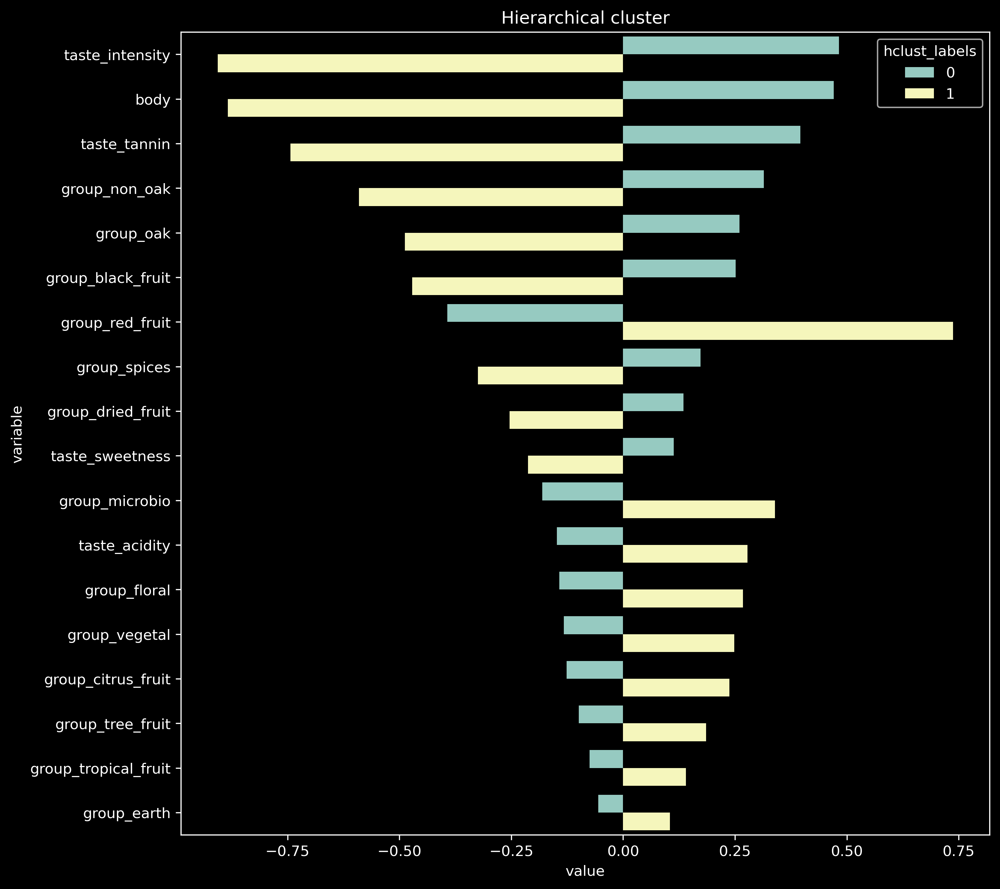

In [36]:
# Visualise
plt.figure(figsize=(10,10))

sns.barplot(x="value", y="variable", hue='hclust_labels',
            data = melted_relative_means_hclust)
plt.title('Hierarchical cluster')
plt.show()

**Key Findings:**
- The two clusters of hierarchical clustering are distributed similarly to k-means. 
- When comparing the two clusters, all taste and flavor features are pointing in opposite directions. This means that for one label, the value is above the average, and for the other label, it is below the average, since the data is scaled. For example, the average of 'taste_intensity' for label 1 is -1 (below the average distribution of intensity in total), and for label 0, it is around 0.5 (above average). The taste and group flavors are clear indicators of the clusters. 

***

# Recommendation System <a id="a3"></a>

A content-based recommender is being used, which is user-independent due to the unavailability of user data. The objective is to identify the most similar wines based on the taste, food, and/or flavour of the input wine (favourite wine). The output will be a list of the top 10 most similar wines, along with additional information such as price and ratings. 

Two commonly used approaches for recommendation systems are **Cosine Similarity** and **K-Nearest Neighbors (KNN)**. The table below explains the difference between the two techniques:

|  | Cosine Similarity | KNN | 
|:---------|:--------:|:---------:|
|  Concept  |  Cosine similarity measures the cosine of the angle between two vectors, often used to determine how similar two items are. |  KNN is a supervised learning algorithm used for classification and regression tasks. In the context of recommendation systems, it can be used for collaborative filtering. |  
|  Usage |  In recommendation systems, cosine similarity is used to measure the similarity between user/item vectors. For example, if users and items are represented as vectors in a high-dimensional space (where dimensions correspond to different features), cosine similarity can be used to find items that are most similar to a given user's preferences. |  KNN works by finding the K nearest neighbors to a given item or user based on a similarity metric (e.g., Euclidean distance, cosine similarity). It then predicts ratings or recommendations based on the ratings of those nearest neighbors. | 
|  Calculation |   It calculates the cosine of the angle between two vectors, typically represented as the dot product of the vectors divided by the product of their magnitudes.  |  For each item or user, KNN calculates the distance to all other items or users in the dataset and selects the K nearest ones. | 
|  Scalability |  Cosine similarity can be computationally expensive, especially for large datasets, as it requires calculating the similarity between each pair of items or users. |  KNN can be computationally expensive, especially as the size of the dataset grows, since it requires calculating distances between the target item/user and all other items/users. | 


## Cosine similarity 

Since all the features are numeric, cosine similarity can be used directly to measure the similarity between two vectors. The closer two vectors (or wines) are, the higher the measure. The similarity ranges from 1 (completely similar) to -1 (completely opposite). To ensure accuracy, different recommendation systems will be built using various features and compared at the end. To compare different recommenders, I have chosen one wine as the anchor to evaluate the results of each recommender.

| Recommender | Features | Number of Features |
|:---------|:--------:|:---------:|
|  1. Recommender: Taste  |  Taste Features |  5 | 
|  2. Recommender: Flavor Group   |  Flavor Group Features   |  13   | 
|  3. Recommender: All Flavor |  Flavor Groups & Subgroups |  468  |  
|  4. Recommender: Food |  Food Features  |  16  |   1.0 | 
|  5. Recommender: All Features |  Taste, Food, Flavor, Subflavor  |  489  | 
|  6. Recommender: Taste & Flavor |  Taste, Flavor Group |  18  | 


In [12]:
# Input wine
wine_index = '1181258_2022'

### Taste

Before building a recommendation function, I am doing it step by step.

In [91]:
# Get the cosine similarity
similarities = cosine_similarity(taste, dense_output=False)
similarities

array([[ 1.        ,  0.7742437 ,  0.2550901 , ..., -0.49413279,
        -0.50241418, -0.19577085],
       [ 0.7742437 ,  1.        ,  0.40788604, ..., -0.06436872,
        -0.19248278, -0.18003645],
       [ 0.2550901 ,  0.40788604,  1.        , ..., -0.56688506,
        -0.69530955, -0.87061433],
       ...,
       [-0.49413279, -0.06436872, -0.56688506, ...,  1.        ,
         0.97175528,  0.75708465],
       [-0.50241418, -0.19248278, -0.69530955, ...,  0.97175528,
         1.        ,  0.87361377],
       [-0.19577085, -0.18003645, -0.87061433, ...,  0.75708465,
         0.87361377,  1.        ]])

In [166]:
# Retrieve the similarity scores for the given wine_index
wine_similarity_scores = similarities[taste.index.get_loc(wine_index)]

# Create a DataFrame to hold wine indices and their similarity scores
sim_df = pd.DataFrame({'wine_index': taste.index,
                       'similarity': wine_similarity_scores})

#set similarity smaller than 0.99999 to not get the same wine from a different year
sim_df[sim_df['similarity'] < 0.99999].head(10)

,wine_index,similarity
0,6247930_2020,0.505994
1,4902052_2018,0.230172
2,1202271_2015,0.749454
3,7212283_2022,0.410652
4,1551777_2018,0.738619
5,2589911_2018,0.723819
6,1622963_2019,0.076001
7,7990881_2018,0.677367
8,5831544_2022,-0.215608
9,75586_2020,0.099242


In [167]:
# Sort the DataFrame by similarity scores and retrieve the top 10 most similar wines
top_10 = sim_df[sim_df['similarity'] < 0.9999].sort_values(by='similarity', ascending=False).head(10)
result_df = df_complete.loc[list(top_10['wine_index'].values)]
result_df[['wine_name', 'year', 'price', 'avg_rating_wine_year']]

,wine_name,year,price,avg_rating_wine_year
index,,,,
1178837_2018,Cuvée Tradition Gigondas,2018,26.95,4.2
1178837_2021,Cuvée Tradition Gigondas,2021,28.50,4.1
1178837_2019,Cuvée Tradition Gigondas,2019,26.75,4.1
1178837_2020,Cuvée Tradition Gigondas,2020,28.95,4.1
1561449_2007,Vieilles Vignes,2007,42.10,4.1
1561449_2015,Vieilles Vignes,2015,35.29,4.0
91072_2019,Garrigues Vacqueyras,2019,27.54,3.6
2474901_2021,HH300 Barrel Project Shiraz,2021,18.00,3.7
1696777_2014,Beau Mélange,2014,138.22,4.6


**Key Findings:**
- The step-by-step process indicates that there are duplicate wines, but only from different years. The final recommender should only display one of them.
- Additionally, it would be helpful to include the similarity score to provide an idea of how closely the top match aligns.

In [94]:
# Show whole column width
pd.set_option('display.max_colwidth', None)

In [35]:
taste.info()

<class 'pandas.core.frame.DataFrame'>
Index: 44642 entries, 6247930_2020 to 99974_1997
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   body             44642 non-null  float64
 1   taste_intensity  44642 non-null  float64
 2   taste_tannin     44642 non-null  float64
 3   taste_sweetness  44642 non-null  float64
 4   taste_acidity    44642 non-null  float64
dtypes: float64(5)
memory usage: 3.1+ MB


In [40]:
def recommender(features, wine_index, max_price=df_complete['price'].max(), min_rating = 0) :
    """

    Recommender function to calculate the similarity between different wines based on different features.

    Input:
    - features: Which features should be used to calculate the cosine similarity
    - wine_index: The wine index of the favourite wine
    optional inputs:
    - max_price: Maximum wine for the recommendations
    - min_rating: Minimum rating score for the recommendation



    Returns:
    Top 10 most similar wines based on cosine similarity and on the filtering if optional inputs are given

   """

    # Get the feature vector for the wine with index 
    wine_feature_vector = features.loc[wine_index]

    # Get feature vectors for all other wines
    other_wines_feature_vectors = features.drop(wine_index)

    # Calculate cosine similarity between the wine and all other wines
    wine_similarity_scores = cosine_similarity([wine_feature_vector], other_wines_feature_vectors)[0]

    df_wines = df_complete.drop(wine_index)
    
    # Create a DataFrame to hold wine indices and their similarity scores
    sim_df = pd.DataFrame({
                           'wine_name':  df_wines['wine_name'],
                           'winery': df_wines['winery'],
                       'similarity': wine_similarity_scores,
                       'price': df_wines['price'],
                       'year':  df_wines['year'],
                       'rating':  df_wines['avg_rating_wine_year'],
                       'url':  df_wines['url'],
                       'wine_id':df_wines['wine_id']})

    # Filtering
    # Not the same Wine from different years
    cond_1 = sim_df['wine_id'] != df_complete.loc[wine_index]['wine_id']
    # Maximum Price
    cond_2 = sim_df['price'] <= max_price
    # Minimum Rating
    cond_3 = sim_df['rating'] >= min_rating
    
    # Sort the DataFrame by similarity scores and retrieve the top 10 most similar wines
    top_1000 = sim_df[cond_1 & cond_2 & cond_3].sort_values(by='similarity', ascending=False).head(1000)
    
    # Drop duplicates of wines
    top_10 = top_1000.drop_duplicates('wine_id', keep = 'first').head(10)

    return top_10

In [96]:
recommender(taste, wine_index)

,wine_name,winery,similarity,price,year,rating,url,wine_id
index,,,,,,,,
1178837_2018,Cuvée Tradition Gigondas,Domaine du Gour de Chaule,0.998955,26.95,2018,4.2,https://wine-raks.myshopify.com/collections/all/products/gigondas-2014-gour-de-chaule,1178837
1561449_2007,Vieilles Vignes,Clos de Trias,0.996298,42.10,2007,4.1,https://wine.gauntleys.com/uk/product/10715/clos-de-trias-ventoux-vieilles-vignes-2007,1561449
91072_2019,Garrigues Vacqueyras,Montirius,0.993322,27.54,2019,3.6,https://www.shelvedwine.com/product/vacqueyras-garriques-montirius-2019/,91072
2474901_2021,HH300 Barrel Project Shiraz,Peter Lehmann,0.992854,18.00,2021,3.7,https://australianwinecentre.co.uk/products/peter-lehmann-hills-valley-barossa-shiraz-2015-14-0-6x75,2474901
1696777_2014,Beau Mélange,Château Margene,0.992385,138.22,2014,4.6,https://cultwinesintl.com/product/2014-chateau-margene-beau-melange-bordeaux-blend/,1696777
73843_2021,Domaine Grand Romane Rouge Vielles Vignes,Pierre Amadieu,0.991209,14.95,2021,3.9,https://champagnesandchateaux.co.uk/shop/wines/pierre-amadieu-gigondas-domaine-grand-romane-2021-375ml/,73843
1125308_2020,Gigondas,Domaine Raspail-Ay,0.990503,30.45,2020,4.2,https://www.perfectcellar.com/products/copy-of-domaine-raspail-ay-gigondas-2019,1125308
8679923_2021,Pi Châteauneuf-du-Pape,Domaine Chante Cigale,0.990489,51.37,2021,4.2,https://www.kwmwine.com/Models.aspx?ModelID=6130,8679923
1176685_2020,Côtes du Rhône Selection Mon Coeur,Domaine Jean-Louis Chave,0.990031,15.00,2020,4.0,https://www.rfvintners.co.uk/products/2020-jl-chave-cotes-du-rhone-mon-coeur,1176685


**Key Findings:**
- The wine with the highest similarity score is 0.999, indicating a very close match with other wines that have a similar taste profile.

In [97]:
# Function to visualise similarity
def recommender_visualisation(features, wine_index):
    """

    Recommender function to calculate the similarity between different wines based on different features.

    Input:
    - features: Which features should be used to calculate the cosine similarity
    - wine_index: The wine index of the favourite wine

    Returns:
    Barplot of the scaled features of the favourite wine and the most similar wine

   """


    # Retrieve feature vectors for the input wine and the top similar wine
    input_wine_features = features.loc[wine_index]
    top_wine_index = recommender(features, wine_index).index[0]
    top_wine_features = features.loc[top_wine_index]

    # Create a DataFrame to display the comparison
    comparison_df = pd.DataFrame({'Input Wine': input_wine_features, 'Top Similar Wine': top_wine_features})

    # Reset index to make wine identifiers as a regular column
    comparison_df.reset_index(inplace=True)

    # Rename the index column to 'Wine'
    comparison_df.rename(columns={'index': 'Feature'}, inplace=True)

    # Melt the DataFrame to convert it to long format
    melted_df = comparison_df.melt(id_vars='Feature', var_name='Wine', value_name='Value')

    # Plot the comparison using Seaborn barplot
    plt.style.use('dark_background')
    plt.figure(figsize=(12, 5), dpi=300)
    sns.barplot(x='Value', y='Feature', hue='Wine', data=melted_df.sort_values(by='Value'), palette=["darkred", "olive"])
    plt.title('Comparison of Features between Input Wine and Top Similar Wine')
    plt.xlabel('Value')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()

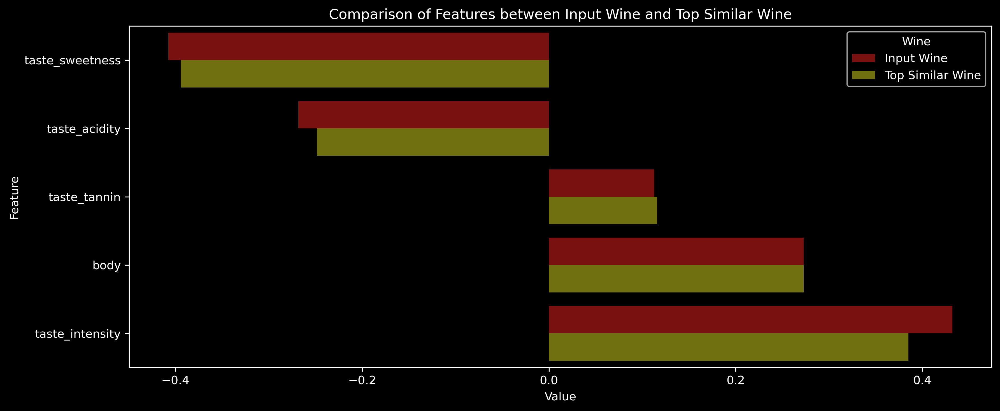

In [164]:
recommender_visualisation(taste, wine_index)

**Key Findings:**
- The graph shows that the recommender was able to match all taste features in the same direction as the scaled features, both above and below average, to a similar extent. 
- This highlights the very similar taste profile of the top match compared to the favourite wine.

### Flavor

In [100]:
recommender(flavor_group, wine_index)

,wine_name,winery,similarity,price,year,rating,url,wine_id
index,,,,,,,,
1127572_2021,Pic-Saint-Loup Grande Cuvée,Domaine de l'Hortus,0.827007,35.20,2021,4.2,https://www.shelvedwine.com/product/grande-cuvee-rouge-domaine-de-lhortus/,1127572
5461_2020,Löwengang Uvaggio Storico,Alois Lageder,0.821352,70.79,2020,4.2,https://www.ewein.com/wein/rotwein/alois-lageder-loewengang-uvaggio-storico-bio-2020.html,5461
4194598_2022,El Bandito The Dark Side,Testalonga,0.810326,36.50,2022,3.7,https://nattyboywines.co.uk/collections/all/products/testalonga-the-dark-side-syrah-2022,4194598
6597289_2018,Grande Reserva,Quinta do Sobreiró de Cima,0.809321,12.80,2018,4.1,https://gourmetdavila.pt/pt/vinhos-portugueses/4709-quinta-do-sobreiro-de-cima-grande-reserva-tinto-2018.html,6597289
1214821_2019,Saint-Joseph Lieu-Dit,E. Guigal,0.808743,28.99,2019,4.4,https://www.baythornewines.co.uk/collections/all/products/2018-st-joseph-rouge-e-guigal-rhone-france,1214821
99554_2017,Mestizaje Tinto,Mustiguillo,0.794030,16.99,2017,3.8,http://martinez.co.uk/browse/category/wine/SPAINR213/,99554
1284359_2014,Heloise,Chêne Bleu,0.793113,55.34,2014,4.4,https://www.moncopaincaviste.com/en/Heloise-2014-Chene-Bleu-Vaucluse-14684.html,1284359
87833_2018,Les Auréliens Rouge,Triennes,0.791468,17.02,2018,3.8,https://winesquare.co.uk/products/2018-les-aureliens-rouge-triennes,87833
1277016_2020,Reserve Syrah,Edna Valley Vineyard,0.786236,69.95,2020,4.3,https://www.southdownscellars.co.uk/shop_detail/Bien+Nacido+Chardonnay/P11333,1277016


**Key Findings:**
- The closest top match with the flavor group features has a similarity of 0.83, which is still relatively high.

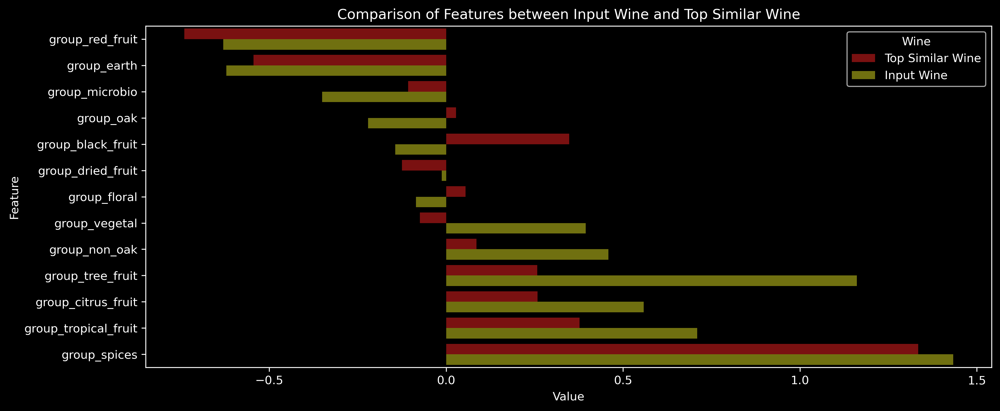

In [165]:
recommender_visualisation(flavor_group, wine_index)

**Key Findings:**
- The graph indicates that the input wine and the most similar wine share the same direction for most group flavors, except for black_fruit and tropical_fruit which point in different directions. 
- Notably, the strong flavors of this wine, such as spices, are highly similar.

In [102]:
recommender(all_flavor, wine_index)

,wine_name,winery,similarity,price,year,rating,url,wine_id
index,,,,,,,,
79071_2020,Aloxe-Corton,Domaine Gaston & Pierre Ravaut,0.361725,51.80,2020,3.9,https://batonnagewines.com/products/domaine-ravaut-aloxe-corton-burgundy-2018,79071
1788781_2021,Cheverny Rouge,Domaine du Salvard,0.358813,16.30,2021,4.0,http://www.josephbarneswines.com/collections/french-red-wine/products/domaine-du-salvard-cheverny-rouge-2021,1788781
2033400_2021,Beaune Les Blanches Fleurs,Domaine Tollot-Beaut,0.355985,47.00,2021,4.1,https://tanners-wines-ltd.myshopify.com/products/beaune-les-blanches-fleurs-tollot-beaut-2021?variant=47830130524468,2033400
3256543_2022,L'Ùltim,Gilles Troullier,0.346781,11.96,2022,3.8,https://www.cave-spirituelle.com/domaine-gilles-troullier-l-ultim-rouge-2022.html,3256543
5764241_2019,The Bear Red,Donkey & Goat,0.338984,51.00,2019,3.8,http://www.nekterwines.com/shop-red-wine/dandg-thebear,5764241
1129055_2005,Nuits-Saint-Georges 1er Cru 'Clos des Argillières',Bertrand Ambroise,0.334537,123.59,2005,4.0,https://ladywine.co.uk/shop/?id=1017887200500750,1129055
1521097_2022,Montado Tempranillo,Finca Constancia,0.329961,9.25,2022,3.5,https://www.ampswinemerchants.co.uk/product/montado-tempranillo-2020/,1521097
1295289_2020,Saint-Joseph Rouge,Domaine du Chêne,0.328273,25.62,2020,3.9,https://haags-wijnhuis-326939.webshopapp.com/2020-saint-joseph-rouge-du-chene.html,1295289
1166413_2021,Château Pont de Pierre Lussac-Saint-Émilion,Vergniol,0.323035,10.49,2021,3.7,https://cellier.co.uk/products/vergniol-chateau-pont-de-pierre-lussac-saint-emilion-2018,1166413


**Key Findings:**
- When including the subflavors in the features, the top match has only a similarity of 0.36 since it is hard to match that many features and find a similar wine.
- The problem is that due to the scaling all flavors have the same weight.
- Therefore, the subflavors might be too many to include in the features or need to have less weight compared to the flavor group.

### Food

In [103]:
recommender(food, wine_index)

,wine_name,winery,similarity,price,year,rating,url,wine_id
index,,,,,,,,
97712_2017,Ribera del Duero Tinto,Cepa 21,1.0,24.50,2017,4.1,https://originspain.co.uk/catalog/wine/product/cepa-21/,97712
1185813_2019,L'Ecuyer Haut-Médoc,Château du Moulin Rouge,1.0,15.95,2019,3.9,https://www.davywine.co.uk/product/lecuyer-du-moulin-rouge/,1185813
1128248_2021,Côtes-du-Rhône-Villages 'Plan de Dieu',Domaine de l'Espigouette,1.0,15.95,2021,3.8,https://www.perfectcellar.com/products/domaine-de-lespigouette-plan-de-dieu-cotes-du-rhone-villages-2021,1128248
1561814_2021,Rasteau Rouge,Domaine des Escaravailles,1.0,15.99,2021,3.8,https://www.cambridgewine.com/shop/products/wine/red-wine/rasteau-les-cteaux-2021-dom-des-escaravailles.html,1561814
7369619_2020,Amphitheatre Cabernet Franc,The Boneline,1.0,39.79,2020,4.1,https://winenz.com/the-boneline-amphitheatre-cabernet-franc-2020/,7369619
6463757_2021,Graft,Lukas Van Loggerenberg,1.0,39.95,2021,4.1,https://www.sugarbirdwines.com/graft-syrah-2021.html,6463757
1191221_2017,Le Haut-Médoc d'Issan,Château d'Issan,1.0,39.67,2017,4.0,https://crsfw.com/product/issan-14421531,1191221
5364164_2018,Spring Lamb Syrah,Elysian Springs,1.0,15.99,2018,3.9,https://cellier.co.uk/products/elysian-springs-spring-lamb-adelaide-hills-shiraz,5364164
1199508_2022,Côtes-du-Rhône Villages,Château Maucoil,1.0,15.20,2022,3.9,https://www.drinkfinder.co.uk/p/119171/organic-wines/chateau-maucoil/chateau-maucoil-cotes-du-rhone-villages-2022-organic-75cl,1199508


**Key Findings:**
- Many wines have a similar food profile to the input wine, resulting in a high number of wines with a similarity score of 1. This suggests that food alone is not the most effective feature for recommendations and may be better suited for filtering. 

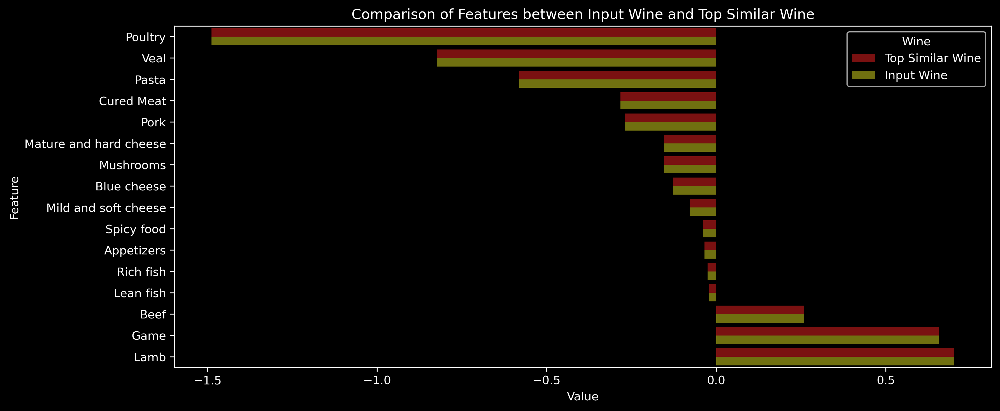

In [104]:
recommender_visualisation(food, wine_index)

**Key Findings:**
- This graph highlights that food is not the best indicator as it matches many wines to the exact amount of each food.

### All Features

In [106]:
recommender(feature_scaled, wine_index)

,wine_name,winery,similarity,price,year,rating,url,wine_id
index,,,,,,,,
79071_2020,Aloxe-Corton,Domaine Gaston & Pierre Ravaut,0.351219,51.80,2020,3.9,https://batonnagewines.com/products/domaine-ravaut-aloxe-corton-burgundy-2018,79071
2033400_2021,Beaune Les Blanches Fleurs,Domaine Tollot-Beaut,0.346634,47.00,2021,4.1,https://tanners-wines-ltd.myshopify.com/products/beaune-les-blanches-fleurs-tollot-beaut-2021?variant=47830130524468,2033400
3256543_2022,L'Ùltim,Gilles Troullier,0.338463,11.96,2022,3.8,https://www.cave-spirituelle.com/domaine-gilles-troullier-l-ultim-rouge-2022.html,3256543
1295289_2020,Saint-Joseph Rouge,Domaine du Chêne,0.330718,25.62,2020,3.9,https://haags-wijnhuis-326939.webshopapp.com/2020-saint-joseph-rouge-du-chene.html,1295289
5764241_2019,The Bear Red,Donkey & Goat,0.329353,51.00,2019,3.8,http://www.nekterwines.com/shop-red-wine/dandg-thebear,5764241
1129055_2005,Nuits-Saint-Georges 1er Cru 'Clos des Argillières',Bertrand Ambroise,0.327293,123.59,2005,4.0,https://ladywine.co.uk/shop/?id=1017887200500750,1129055
1166413_2021,Château Pont de Pierre Lussac-Saint-Émilion,Vergniol,0.324864,10.49,2021,3.7,https://cellier.co.uk/products/vergniol-chateau-pont-de-pierre-lussac-saint-emilion-2018,1166413
1788781_2021,Cheverny Rouge,Domaine du Salvard,0.321892,16.30,2021,4.0,http://www.josephbarneswines.com/collections/french-red-wine/products/domaine-du-salvard-cheverny-rouge-2021,1788781
1521097_2022,Montado Tempranillo,Finca Constancia,0.318631,9.25,2022,3.5,https://www.ampswinemerchants.co.uk/product/montado-tempranillo-2020/,1521097


**Key Findings:**
- Similar to the previous recommender, the low similarity score is due to the many subflavors. This suggests that not all features should be included. Therefore, I will perform feature selection in the following.

### Taste & Flavor Group

In [107]:
recommender(taste_flavor_group, wine_index)

,wine_name,winery,similarity,price,year,rating,url,wine_id
index,,,,,,,,
1127572_2021,Pic-Saint-Loup Grande Cuvée,Domaine de l'Hortus,0.802204,35.20,2021,4.2,https://www.shelvedwine.com/product/grande-cuvee-rouge-domaine-de-lhortus/,1127572
1214821_2021,Saint-Joseph Lieu-Dit,E. Guigal,0.784597,43.00,2021,4.2,https://www.londonendwines.com/collections/red-wine/products/e-guigal-saint-joseph-lieu-dit-rouge-2021,1214821
1277016_2020,Reserve Syrah,Edna Valley Vineyard,0.780049,69.95,2020,4.3,https://www.southdownscellars.co.uk/shop_detail/Bien+Nacido+Chardonnay/P11333,1277016
6597289_2018,Grande Reserva,Quinta do Sobreiró de Cima,0.769348,12.80,2018,4.1,https://gourmetdavila.pt/pt/vinhos-portugueses/4709-quinta-do-sobreiro-de-cima-grande-reserva-tinto-2018.html,6597289
1365824_2021,Reserve Pinotage - Shiraz,Billy Bosch,0.762285,11.99,2021,3.8,https://www.virginwines.co.uk/wine/Z39806100009/Billy-Bosch-Pinotage-Shiraz,1365824
6989846_2018,Reserve Syrah,Creation,0.762063,21.91,2018,4.2,https://www.worldwinesweb.be/en_GB/shop/zacresyr-creation-reserve-syrah-2018-1344?page=8&category=74,6989846
2031358_2021,Cellar Selection Gimblett Gravels Syrah,Villa Maria,0.759010,20.84,2021,3.9,https://winenz.com/villa-maria-reserve-gimblett-gravels-syrah-2021/,2031358
1772238_2018,Archange Rouge,Domaine des Anges,0.758489,19.99,2018,4.1,https://www.directwineshipments.com/shop/domaine-des-anges-cotes-du-ventoux-archange/,1772238
1199508_2021,Côtes-du-Rhône Villages,Château Maucoil,0.741067,14.99,2021,4.0,https://www.twrightwine.co.uk/18994-Chateau-Maucoil-Cotes-du-Rhone-Villages,1199508


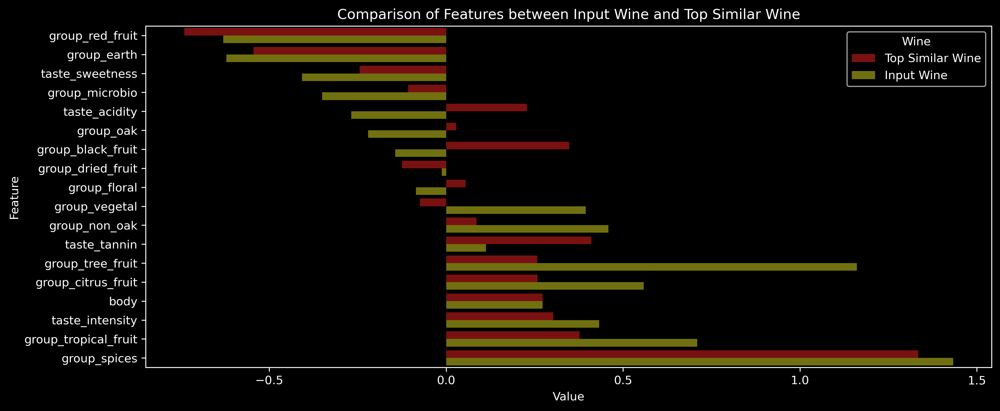

In [108]:
recommender_visualisation(taste_flavor_group, wine_index)

**Key Findings:**
- The graph indicates that the majority of taste and flavor group features are aligned in the same direction, with only 4 out of the 18 features pointing in different directions. 
- In particular, the most prominent group, spices, is almost at the same level as the input wine.

### Comparison Cosine Similarity

In [117]:
recommender_list = []

feature_list = [taste, flavor_group, all_flavor, food, feature_scaled, taste_flavor_group]


for f in feature_list:
    recommender_list.append(recommender(f, wine_index).iloc[:1,:])


comparison = pd.concat(recommender_list, ignore_index=True)

recommender_features = {'features': ['taste', 
                                     'flavor group', 
                                     'flavor group + subgroup', 
                                     'food', 
                                     'all features', 
                                     'taste + flavor group'],
                        'number of features': [taste.shape[1],
                                               flavor_group.shape[1], 
                                               all_flavor.shape[1], 
                                               food.shape[1], 
                                               feature_scaled.shape[1], 
                                               taste_flavor_group.shape[1]]}

feature_comp = pd.DataFrame.from_dict(recommender_features)
comparison_results = pd.concat([feature_comp, comparison], axis=1)
comparison_results[['features', 'number of features', 'wine_name', 'similarity']]

,features,number of features,wine_name,similarity
0,taste,5,Cuvée Tradition Gigondas,0.998955
1,flavor group,13,Pic-Saint-Loup Grande Cuvée,0.827007
2,flavor group + subgroup,468,Aloxe-Corton,0.361725
3,food,16,Ribera del Duero Tinto,1.000000
4,all features,489,Aloxe-Corton,0.351219
5,taste + flavor group,18,Pic-Saint-Loup Grande Cuvée,0.802204


**Key Findings:**

- Each recommender has a different top wine which is the most similar showing it depends on the features which wine will be recommended to the customer.
- The similarity scores range from 0.35 when using all features to 1.0 when using just food features.
- As the food features do not provide much insight, they may be better suited for filtering rather than as a recommendation feature. 
- Including all subflavors significantly reduces the similarity score due to the high number of features. Therefore, it might be better to not include them or finding a different scaler to give them less importance compared to the taste and flavor groups.
- The taste and flavor group features still have a high enough similarity score of 0.8, indicating that the wines are likely similar in taste and flavor. Thus, recommender 5 might be the best wine recommender.


Recommender Summary:

| Recommender | Features | Number of Features | Top Wine Similarity | 
|:---------|:--------:|:---------:|:---------:|
|  0. Recommender: Taste  |  Taste Features |  5 |   0.999613 | 
|  1. Recommender: Flavor Group   |  Flavor Group Features   |  13   |   1.000000 |  
|  2. Recommender: All Flavor |  Flavor Groups & Subgroups |  468  |   0.36 | 
|  3. Recommender: Food |  Food Features  |  16  |   1.0 | 
|  4. Recommender: All Features |  Taste, Food, Flavor, Subflavor  |  489  |   0.35 | 
|  5. Recommender: Taste & Flavor |  Taste, Flavor Group |  18  |   0.80 | 

***

### PCA on subflavors

To include the subflavors in the cosine similarity, it might make sense to use PCA. Therefore, I am checking how many PCs I need to have a good representation of the subflavors.

In [39]:
flavor_subgroup = feature_scaled.iloc[:,18:-16]

In [40]:
# instantiate PCA
pca = PCA()

# fit + transform
pca_data = pca.fit_transform(flavor_subgroup)
# create dataframe for PC transformed scaled data
pca_df = pd.DataFrame(pca_data)

In [41]:
# viewing share of explained variance by principal component
ex_var_ratio = pca.explained_variance_ratio_
ex_var_ratio.cumsum()

array([0.0091717 , 0.01584531, 0.02110826, 0.02574918, 0.03019667,
       0.03442333, 0.03837679, 0.04221331, 0.04602513, 0.04976176,
       0.05346148, 0.05709571, 0.06067493, 0.06415859, 0.06763809,
       0.07107131, 0.07448735, 0.07787333, 0.08121099, 0.08451302,
       0.08780922, 0.0910681 , 0.09430611, 0.09753024, 0.10070934,
       0.10386593, 0.10701485, 0.11014804, 0.11327711, 0.1163821 ,
       0.11946327, 0.12252234, 0.12556562, 0.12860658, 0.13163965,
       0.1346687 , 0.1376785 , 0.1406839 , 0.14366793, 0.14664445,
       0.14960095, 0.15254995, 0.15548438, 0.15841667, 0.16132875,
       0.16422877, 0.16711681, 0.17000066, 0.17287949, 0.17574111,
       0.17859428, 0.18143688, 0.18427575, 0.18710181, 0.18992039,
       0.19272826, 0.19552638, 0.1983211 , 0.2011073 , 0.20388514,
       0.20665775, 0.20941396, 0.21216513, 0.21491093, 0.21765454,
       0.22038812, 0.22311123, 0.22582867, 0.22853171, 0.2312317 ,
       0.2339267 , 0.23661722, 0.2392952 , 0.2419711 , 0.24464

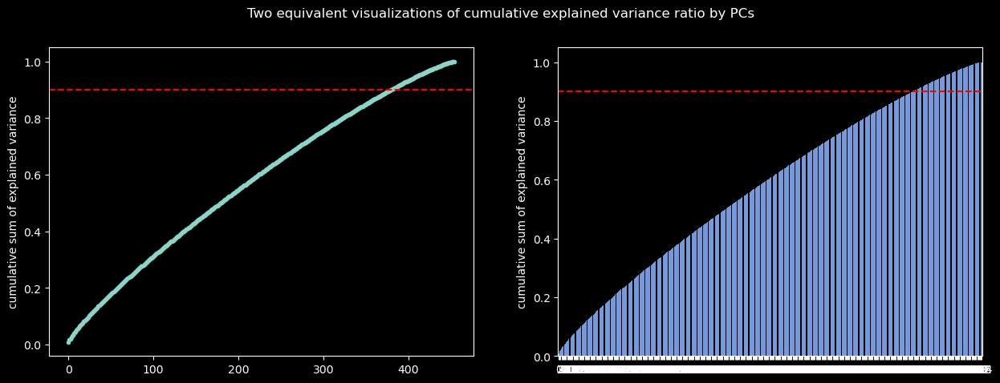

In [42]:
# Visualising 
plt.style.use('dark_background')
plt.subplots(1,2,figsize=(15,5))
plt.suptitle("Two equivalent visualizations of cumulative explained variance ratio by PCs")

# scree plot - visualizing cumulative variance captured
plt.subplot(1,2,1)
plt.plot(pca_df.columns, ex_var_ratio.cumsum(), marker='.')
plt.axhline(0.9, color='red', linestyle='--')

plt.ylabel('cumulative sum of explained variance')

plt.subplot(1,2,2)
sns.barplot(x=pca_df.columns, y=ex_var_ratio.cumsum(), color='cornflowerblue')
plt.axhline(0.9, color='red', linestyle='--')

plt.ylabel('cumulative sum of explained variance')

plt.show()

**Key Findings:**
- The graphs show that for the representation of the subflavors in PCs almost increase linear. This means the more PCs the more data is representative. Therefore, it does not make sense to include only a few subflavor PCs since they do not represent the data. 

***

## KNN (k-nearest neighbor)

In KNN recommendation systems, the choice of distance metric is important in determining item similarity. For content-based recommendation systems, the Euclidean distance metric is often used as it measures the geometric distance between items in the feature space, capturing both magnitude and direction of their feature vectors. Therefore, I am using the default metric, which is 'minkowski', a standard Euclidean distance when p = 2.

In [26]:
def knn_recommender(features, wine_index):

    """
    Recommender function to calculate the knn distance between different wines based on different features.

    Input:
    - features: Which features should be used to calculate the cosine similarity
    - wine_index: The wine index of the favourite wine

    Returns:
    top 10 most similar wines based on knn.

   """

    neighbor_taste = NearestNeighbors(n_neighbors=1000, algorithm='brute')
    neighbor_taste.fit(features)

    distances, index = neighbor_taste.kneighbors(features.loc[[wine_index]])

    # Create a DataFrame to hold wine indices and their similarity scores
    sim_df = pd.DataFrame({'wine_name': df_complete['wine_name'].iloc[index[0]].values,
                        'distance': distances[0],
                        'price':df_complete['price'].iloc[index[0]].values,
                        'year': df_complete['year'].iloc[index[0]].values,
                        'rating': df_complete['avg_rating_wine_year'].iloc[index[0]].values,
                        'wine_id': df_complete['wine_id'].iloc[index[0]].values})
    
    # Not the same Wine from different years
    cond_1 = sim_df['wine_id'] != df_complete.loc[wine_index]['wine_id']

     # Drop duplicates of wines
    top_10 = sim_df[cond_1].drop_duplicates('wine_id', keep = 'first').head(10)
    
    return top_10

In [27]:
knn_recommender(taste, wine_index)

,wine_name,distance,price,year,rating,wine_id
5,Cuvée Tradition Gigondas,0.052887,26.75,2019,4.1,1178837
9,Vieilles Vignes,0.065129,42.10,2007,4.1,1561449
11,Domaine Grand Romane Rouge Vielles Vignes,0.095414,60.50,2020,4.1,73843
13,Gigondas,0.101573,30.45,2020,4.2,1125308
14,Côtes du Rhône Selection Mon Coeur,0.103809,17.25,2022,3.9,1176685
16,Côtes-du-Rhône Village Les Becs Fins Rouge,0.120480,11.10,2018,3.7,77511
18,Côtes du Rhône Les Deux Albion,0.129953,22.00,2019,3.8,1173569
20,Gigondas,0.133638,26.99,2020,4.0,1139012
22,Vinsobres Les Cornuds,0.149761,16.99,2019,3.8,1124245
25,Vacqueyras Grande Garrigue,0.151161,21.00,2020,4.1,88383


In [28]:
knn_recommender(flavor_group, wine_index)

,wine_name,distance,price,year,rating,wine_id
5,Pic-Saint-Loup Grande Cuvée,1.341448,35.20,2021,4.2,1127572
7,Saint-Joseph Lieu-Dit,1.399997,43.00,2021,4.2,1214821
9,El Bandito The Dark Side,1.404719,36.50,2022,3.7,4194598
10,Les Auréliens Rouge,1.452063,17.02,2018,3.8,87833
11,Iselis Rosso,1.497587,13.07,2018,4.0,1173788
13,Heloise,1.500814,55.34,2014,4.4,1284359
17,Mestizaje Tinto,1.506359,16.99,2017,3.8,99554
20,The Pavillion Shiraz - Cabernet Sauvignon,1.513601,8.76,2019,3.6,1168501
21,La Sangre de Jonata,1.555942,170.00,2019,4.4,1880257
22,The Fergus,1.569297,13.17,2018,4.0,1649399


In [29]:
knn_recommender(all_flavor, wine_index)

,wine_name,distance,price,year,rating,wine_id
5,Hermitage,11.174247,50.00,2019,4.2,7780
11,Barbera d'Alba Conca Tre Pile,11.234480,24.77,2019,4.1,75324
18,The Steading,11.369992,19.20,2018,4.1,11803
24,Villa Antinori Rosso,11.395146,22.21,2019,3.9,1656
28,Grand Vin,11.449003,39.50,2018,4.3,24984
30,Côtes-du-Rhône Rouge,11.467800,18.00,2019,3.8,7773
35,Le Serre Nuove,11.487379,59.05,2020,4.4,22448
38,Napa Valley Cabernet Sauvignon,11.531654,82.00,2018,4.4,1698
40,Saint-Esprit Côtes-du-Rhône,11.532693,21.59,2020,3.8,14640
43,Domaine Grand Veneur Côtes du Rhône Les Champa...,11.535626,17.50,2017,3.9,1151894


In [30]:
knn_recommender(food, wine_index)

,wine_name,distance,price,year,rating,wine_id
0,Melior Ribera del Duero,0.0,12.08,2015,3.5,1446214
1,Domaine du Clos des Tourelles Gigondas,0.0,62.00,2021,4.2,3265055
2,Haut-Médoc,0.0,38.76,1985,4.0,80456
3,Zweigelt Mitterjoch,0.0,10.61,2021,3.7,90006
4,Haut-Médoc (Grand Cru Classé),0.0,39.08,2001,4.0,13793
5,Moulis-en-Médoc,0.0,38.43,2001,4.0,79266
6,Le Haut-Médoc d'Issan,0.0,63.00,2019,4.0,1191221
7,Cuvée des Galets Côtes du Rhône,0.0,10.13,2021,3.7,1159662
8,Pato Rebel,0.0,10.56,2016,3.7,1199913
9,Haut-Médoc (Grand Cru Classé),0.0,38.76,1985,4.1,12687


In [31]:
knn_recommender(feature_scaled, wine_index)

,wine_name,distance,price,year,rating,wine_id
5,Côtes-du-Rhône Rouge,11.469495,8.95,2017,3.7,7773
10,Saint-Esprit Côtes-du-Rhône,11.536158,27.59,2019,3.8,14640
13,Domaine Grand Veneur Côtes du Rhône Les Champa...,11.537154,17.50,2017,3.9,1151894
14,Hermitage,11.543243,55.00,2018,4.3,7780
20,The Steading,11.697437,37.50,2019,4.1,11803
26,Estates Seven Oaks Cabernet Sauvignon,11.706380,14.75,2019,4.0,4343
29,Côtes-du-Rhône Réserve Rouge,11.752955,21.90,2021,3.8,1124242
31,Grand Veneur Côtes du Rhône (Réserve),11.770268,8.50,2020,3.7,88377
33,Knights Valley Cabernet Sauvignon,11.770878,45.00,2000,4.1,73660
35,Saint-Émilion Grand Cru (Grand Cru Classé),11.782808,28.20,2020,4.3,5052806


In [32]:
knn_recommender(taste_flavor_group, wine_index)

,wine_name,distance,price,year,rating,wine_id
5,Pic-Saint-Loup Grande Cuvée,1.475646,35.20,2021,4.2,1127572
7,Saint-Joseph Lieu-Dit,1.578619,28.99,2019,4.4,1214821
9,Côtes-du-Rhône Villages,1.686712,15.20,2022,3.9,1199508
11,Sainte Cécile Costières de Nîmes,1.690063,17.50,2020,4.0,1179074
12,Tinto,1.704628,4.70,2018,3.7,1573014
13,Lower East Syrah,1.761835,32.04,2017,3.9,4268895
15,Mestizaje Tinto,1.768802,19.00,2020,3.8,99554
18,The Pavillion Shiraz - Cabernet Sauvignon,1.789897,8.76,2019,3.6,1168501
19,Cellar Selection Gimblett Gravels Syrah,1.829356,20.84,2021,3.9,2031358
20,Cuvée du Papy Saint-Joseph,1.839227,40.99,2020,4.3,1263896


### Comparison KNN

In [41]:
recommender_list = []

feature_list = [taste, flavor_group, all_flavor, food, feature_scaled, taste_flavor_group]


for f in feature_list:
    recommender_list.append(knn_recommender(f, wine_index).iloc[:1,:])

comparison = pd.concat(recommender_list, ignore_index=True)

recommender_features = {'features': ['taste', 
                                     'flavor group', 
                                     'flavor group + subgroup', 
                                     'food', 
                                     'all features', 
                                     'taste + flavor group'],
                        'number of features': [taste.shape[1],
                                               flavor_group.shape[1], 
                                               all_flavor.shape[1], 
                                               food.shape[1], 
                                               feature_scaled.shape[1], 
                                               taste_flavor_group.shape[1]]}

feature_comp = pd.DataFrame.from_dict(recommender_features)
comparison_results = pd.concat([feature_comp, comparison], axis=1)
comparison_results[['features', 'number of features', 'wine_name', 'distance']]

,features,number of features,wine_name,distance
0,taste,5,Cuvée Tradition Gigondas,0.052887
1,flavor group,13,Pic-Saint-Loup Grande Cuvée,1.341448
2,flavor group + subgroup,468,Hermitage,11.174247
3,food,16,Melior Ribera del Duero,0.000000
4,all features,489,Côtes-du-Rhône Rouge,11.469495
5,taste + flavor group,18,Pic-Saint-Loup Grande Cuvée,1.475646


**Key Findings:**

- Each recommender has a different top wine which is the most similar showing it depends on the features which wine will be recommended to the customer.
- The distances range from 0 when using food features to 11.47 when using just all features.
- As the food features do not provide much insight, they may be better suited for filtering rather than as a recommendation feature. 
- Including all subflavors significantly increases the distance due to the high number of features. Therefore, it might be better to not include them or finding a different scaler to give them less importance compared to the taste and flavor groups.
- The taste and flavor group features still have a distance of 1.48, indicating that the wines are likely similar in taste and flavor. Thus, recommender 5 might be the best wine recommender.

## Comparing Cosine Similarity and KNN

The following table compares the diffwerent recommendation systems depending on the freatures and the technqieues Cosine Similarity and KNN. 

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>features</th>
      <th>number of features</th>
      <th>Cosine Similarity wine_name</th>
      <th>Cosine Similarity</th>
      <th>KNN wine_name</th>
      <th>KNN distance</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>0</th>
      <td>taste</td>
      <td>5</td>
      <td>Cuvée Tradition Gigondas</td>
      <td>0.998955</td>
      <td>Cuvée Tradition Gigondas</td>
      <td>0.052887</td>
    </tr>
    <tr>
      <th>1</th>
      <td>flavor group</td>
      <td>13</td>
      <td>Pic-Saint-Loup Grande Cuvée</td>
      <td>0.827007</td>
      <td>Pic-Saint-Loup Grande Cuvée</td>
      <td>1.341448</td>
    </tr>
    <tr>
      <th>2</th>
      <td>flavor group + subgroup</td>
      <td>468</td>
      <td>Aloxe-Corton</td>
      <td>0.361725</td>
      <td>Hermitage</td>
      <td>11.174247</td>
    </tr>
    <tr>
      <th>3</th>
      <td>food</td>
      <td>16</td>
      <td>Ribera del Duero Tinto</td>
      <td>1.000000</td>
      <td>1076 Tinto</td>
      <td>0.000000</td>
    </tr>
    <tr>
      <th>4</th>
      <td>all features</td>
      <td>489</td>
      <td>Aloxe-Corton</td>
      <td>0.351219</td>
      <td>Côtes-du-Rhône Rouge</td>
      <td>11.469495</td>
    </tr>
    <tr>
      <th>5</th>
      <td>taste + flavor group</td>
      <td>18</td>
      <td>Pic-Saint-Loup Grande Cuvée</td>
      <td>0.802204</td>
      <td>Pic-Saint-Loup Grande Cuvée</td>
      <td>1.475646</td>
    </tr>

  </tbody>
</table>
</div>



The comparison shows that when the recommender include taste and/or flavor group features (0, 1, 5), both the Cosine Similarity and KNN techniques produce the same top match.  However, when the recommenders that include subgroup and food features (2, 3, 4), the two techniques yield different results for the closest wine. 

Using only taste and flavor group features, both techniques are likely to function well as content-based recommenders. However, cosine similarity is a better choice in this case because it provides a more interpretable measure of similarity compared to KNN's distance.

***

# Conclusion <a id="a4"></a>

The notebook contains a clustering algorithm and a content-based recommendation model that uses Cosine Similarity and KNN. 

The clustering of taste and flavor group features resulted in 2 clusters which were similar for K-means and Hierarchical clustering. However, K-means showed slightly better separation between the clusters in the PC visualisation.

The recommendation model relies on the selected features to identify the most similar wine. Cosine Similarity is affected by the high number of subflavors, resulting in a lower similarity score. On the other hand, food features tend to achieve perfect similarity due to their consistent distribution across most wines. This trend is also observed when using the KNN technique, where the distance between the top match increases with the addition of subflavors, while using only food features results in a distance of zero. Thus, I am solely concentrating on taste and flavour group characteristics while constructing a recommendation model.

When comparing Cosine similarity and KNN, they produce similar results, particularly when considering only taste and flavor group features. Although both techniques can be computationally expensive, they should be manageable for this dataset. However, KNN's distance is harder to interpret than cosine similarity. Cosine similarity is the better choice in this case as it provides a clear and easily understandable range of similarity from 1 to -1, increasing transparency and trustworthiness of the recommendation system.


**Next Steps:**

- Develop a recommendation system in a Streamlit app with the following:
    - Interactive insights
    - Additional filtering for personalised recommendations
    - Visualisations comparing favorite wines to top matches




***

# Appendix <a id="a5"></a>

## Taste Clusters

In [97]:
#Extract first 4 principal components
pca = PCA(n_components = 3)
pca_data = pca.fit_transform(taste)

# create dataframe for PC transformed scaled data
pca_df = pd.DataFrame(pca_data)
pca_df.head()

,0,1,2
0,-0.912766,0.260196,-0.822883
1,-0.794294,0.204908,-0.986718
2,-1.878871,1.558177,-1.632646
3,-1.211859,0.220529,-1.121192
4,-1.088863,-1.585387,0.434555


/opt/anaconda3/envs/vivino/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


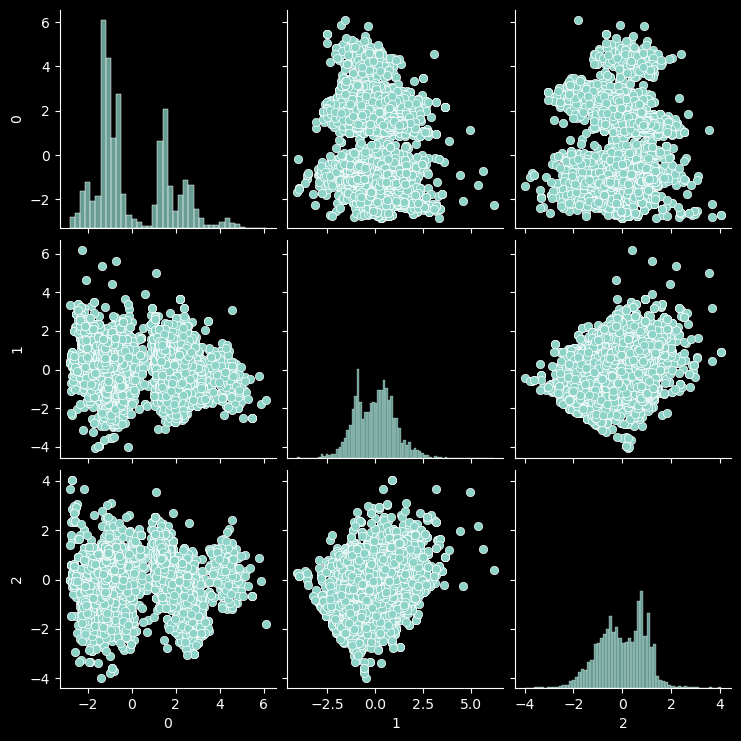

In [98]:
# Visualising
sns.pairplot(pca_df)
plt.show()

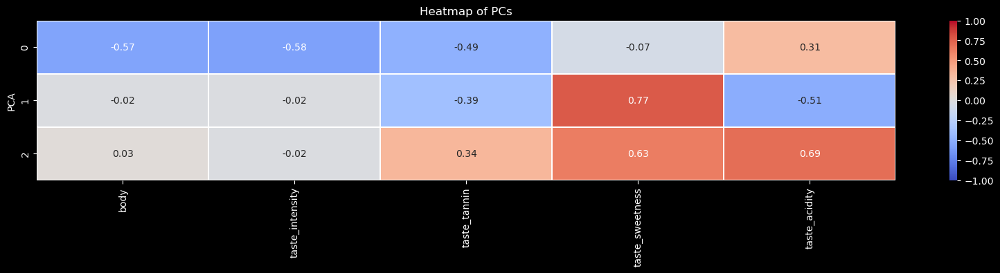

In [99]:
# heatmap correlation matrix between original features and principal components
plt.figure(figsize=(20,3))

sns.heatmap(np.round(pca.components_,2),
            annot=True,
            xticklabels=taste.columns[0:34],
            yticklabels=pca_df.columns,
            linewidths=0.2,
            vmin=-1,
            vmax=1,
            cmap='coolwarm')

plt.ylabel("PCA")
plt.xticks(rotation=90)
plt.yticks(rotation=90)
plt.title('Heatmap of PCs')

plt.show()

In [ ]:
# Define values for k
ks = np.arange(2, 11)

# Create empty lists to save inertia and silhouette scores
inertia = []
silhouette_scores_kmeans = []

# Loop through different values of k
for k in ks:

  # Instantiate model
  my_kmeans = KMeans(n_clusters = k)

  # Fit (+get y labels)
  y_labels_kmeans = my_kmeans.fit_predict(taste)

  # Extract inertia
  inertia.append(my_kmeans.inertia_)

  # Extract silhouette score
  silhouette = silhouette_score(taste, y_labels_kmeans)
  silhouette_scores_kmeans.append(silhouette)

  # Update progress
  print(f'Computed score for k={k}')

Computed score for k=2
Computed score for k=3
Computed score for k=4
Computed score for k=5
Computed score for k=6
Computed score for k=7
Computed score for k=8
Computed score for k=9
Computed score for k=10


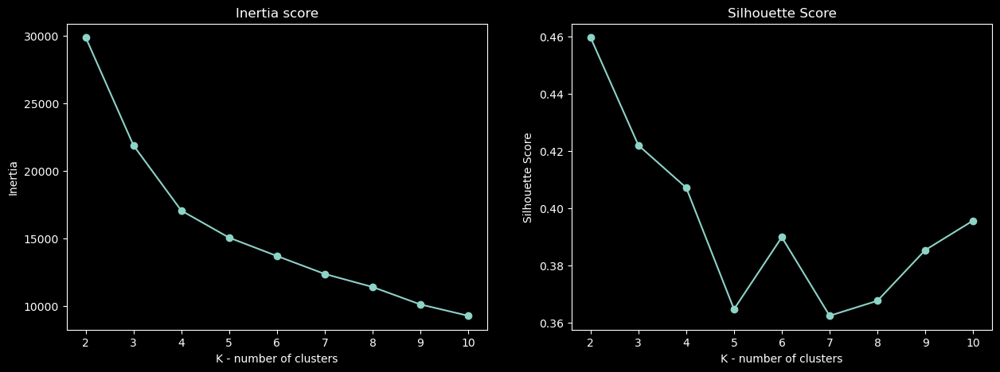

In [ ]:
# Visulaise scores
plt.subplots(1,2,
             figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(ks, inertia, marker='o')
plt.xlabel('K - number of clusters')
plt.ylabel('Inertia')
plt.title('Inertia score')

plt.subplot(1,2,2)
plt.plot(ks, silhouette_scores_kmeans, marker='o')
plt.xlabel('K - number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')

plt.show()

In [ ]:
# Fit final model
kmeans = KMeans(n_clusters = 2)
kmeans_y_labels = kmeans.fit_predict(taste)

# Add labels so that we can color different clusters
df_kmeans = taste.copy()
df_kmeans['kmeans_labels'] = kmeans_y_labels

In [ ]:
def pca_visualise(result_df):

  # Extract clustering column name
  column_names = result_df.columns
  label_column = column_names[column_names.str.contains('_labels')][0]

  #Extract first 4 principal components
  pca = PCA(n_components = 3)
  pca_data = pca.fit_transform(result_df.drop(label_column, axis=1))

  # create dataframe for PC transformed scaled data
  pca_df = pd.DataFrame(pca_data)
  pca_df[label_column] = result_df[label_column].values

  # Visualise
  sns.pairplot(pca_df, hue=label_column)
  plt.show()

/opt/anaconda3/envs/vivino/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


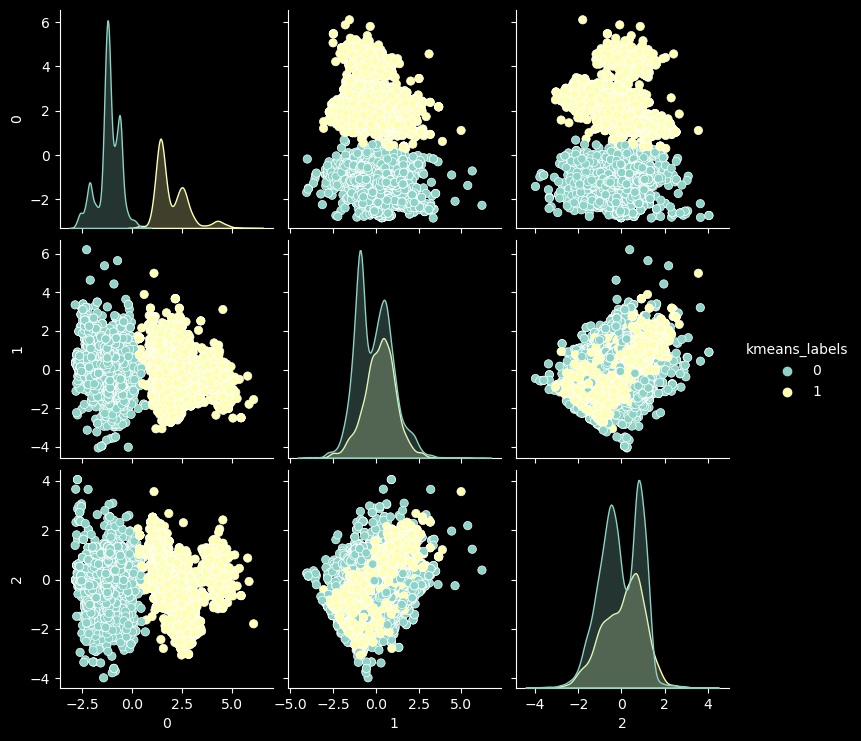

In [ ]:
pca_visualise(df_kmeans)

### Hierarchical Clustering

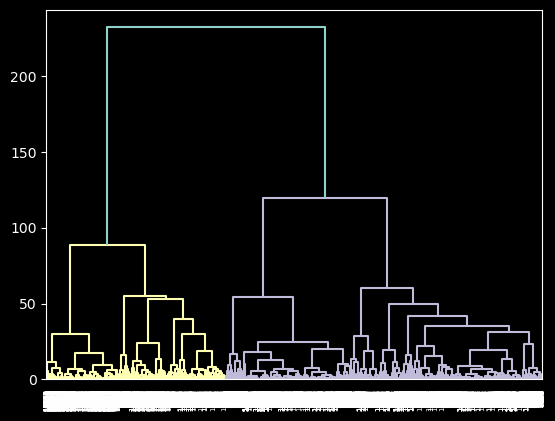

In [ ]:
# Visualize dendrogram
#reminder: ward linkage minimizes within-cluster variance

linkage_mat = linkage(taste, 'ward')

# Plot
plt.figure()
dendrogram(linkage_mat)
plt.show()


In [ ]:
# Fit Agglomerative Clustering (+ loop through k values)

# Define values for k
ks = np.arange(2, 11)

# Create emptys list to save silhouette scores
silhouette_scores_hclust = []

# Loop thtough different values of k
for k in ks:

  # Instantiate
  my_hclust = AgglomerativeClustering(n_clusters=k, linkage='ward')

  # Fit
  y_labels = my_hclust.fit_predict(taste)

  # Append silhouette
  silhouette = silhouette_score(taste, y_labels)
  silhouette_scores_hclust.append(silhouette)

  # Update progress
  print(f'Computed Score for k={k}')


Computed Score for k=2
Computed Score for k=3
Computed Score for k=4
Computed Score for k=5
Computed Score for k=6
Computed Score for k=7
Computed Score for k=8
Computed Score for k=9
Computed Score for k=10


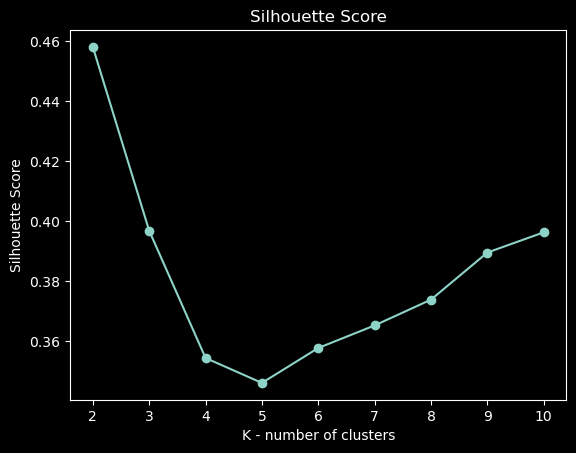

In [ ]:
# Visualise silhouette scores
plt.figure()

plt.plot(ks, silhouette_scores_hclust, marker='o')
plt.xlabel('K - number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()

In [ ]:
# Fit final model
hclust = AgglomerativeClustering(n_clusters = 2, linkage='ward')
hclust_y_labels = hclust.fit_predict(taste)

# Add labels so that we can color different clusters
df_hclust = taste.copy()
df_hclust['hclust_labels'] = hclust_y_labels

/opt/anaconda3/envs/vivino/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


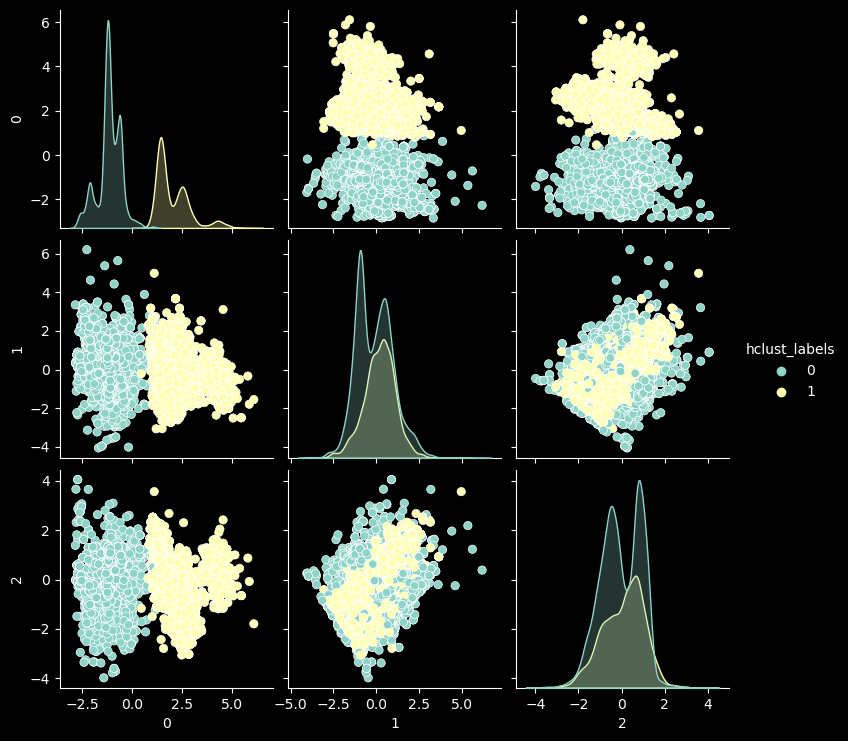

In [ ]:
# Visualise
pca_visualise(df_hclust)

### Comparing Clusters

In [ ]:
taste_cluster_final = taste.copy()
taste_cluster_final['kmeans_labels'] = kmeans_y_labels
taste_cluster_final['hclust_labels'] = hclust_y_labels
taste_cluster_final.head()

,body,taste_intensity,taste_tannin,taste_sweetness,taste_acidity,kmeans_labels,hclust_labels
index,,,,,,,
1181258_2022,0.494019,0.506898,0.089007,-0.255117,-1.002936,0,0
7773_2018,0.494019,0.387735,-0.016325,-0.413092,-1.046749,0,0
2285491_2020,1.655505,0.473343,-0.282109,0.269788,-2.518960,0,0
6359592_2018,0.494019,0.919306,0.087342,-0.452706,-1.239738,0,0
1231606_2014,0.494019,0.776445,1.336639,-0.854692,0.752913,0,0


In [ ]:
taste_cluster_final.groupby('kmeans_labels').mean()

,body,taste_intensity,taste_tannin,taste_sweetness,taste_acidity,hclust_labels
kmeans_labels,,,,,,
0,0.645230,0.662678,0.631149,-0.035792,-0.351108,0.000139
1,-1.112439,-1.142521,-1.088161,0.061709,0.605345,0.985642


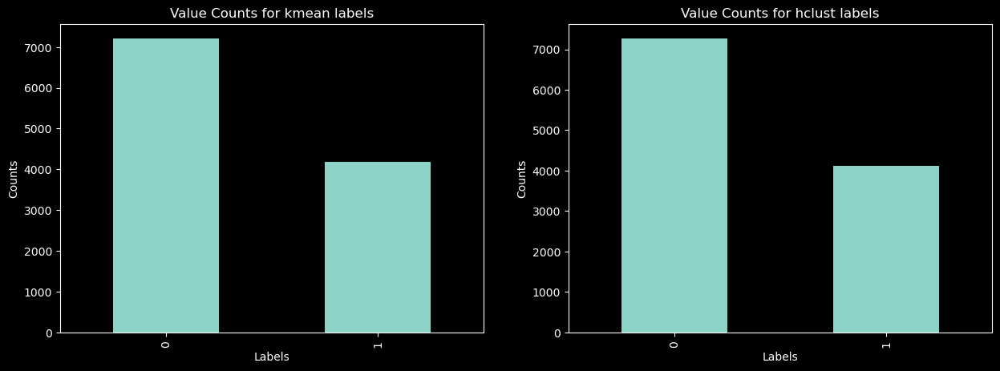

In [ ]:
# Visualise number of clusters
plt.subplots(1,2, figsize=(15,5))

plt.subplot(1,2,1)
taste_cluster_final['kmeans_labels'].value_counts().sort_values(ascending= False).plot(kind='bar')
plt.ylabel('Counts')
plt.xlabel('Labels')
plt.title('Value Counts for kmean labels')

plt.subplot(1,2,2)
taste_cluster_final['hclust_labels'].value_counts().sort_values(ascending= False).plot(kind='bar')
plt.ylabel('Counts')
plt.xlabel('Labels')
plt.title('Value Counts for hclust labels')

plt.show()


In [ ]:
# Compare cluster 1 and cluster 0 (remember our data is standardized!)
relative_means_kmeans = taste_cluster_final.groupby('kmeans_labels').mean()

# Melt dataframe for vizualisation
melted_relative_means_kmeans = relative_means_kmeans.reset_index().melt(id_vars='kmeans_labels')

# Sort by value
melted_relative_means_kmeans = melted_relative_means_kmeans.sort_values('value')

melted_relative_means_kmeans.tail()

,kmeans_labels,variable,value
9,1,taste_acidity,0.605345
4,0,taste_tannin,0.631149
0,0,body,0.645230
2,0,taste_intensity,0.662678
11,1,hclust_labels,0.985642


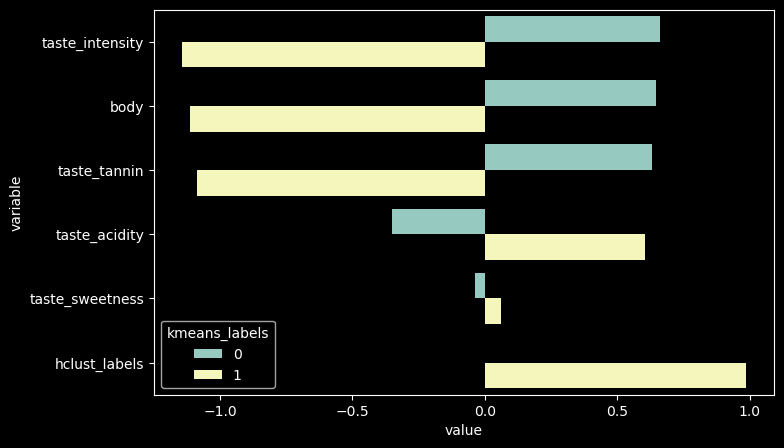

In [ ]:
# Visualise
plt.figure(figsize=(8,5))

sns.barplot(x="value", y="variable", hue='kmeans_labels',
            data = melted_relative_means_kmeans)

plt.show()

In [ ]:
# Compare cluster 1 and cluster 0 (remember our data is standardized!)
relative_means_hclust = taste_cluster_final.groupby('hclust_labels').mean()

# Melt dataframe for vizualisation
melted_relative_means_hclust = relative_means_hclust.reset_index().melt(id_vars='hclust_labels')

# Sort by value
melted_relative_means_hclust = melted_relative_means_hclust.sort_values('value')

melted_relative_means_hclust.head()

,hclust_labels,variable,value
3,1,taste_intensity,-1.149378
1,1,body,-1.119657
5,1,taste_tannin,-1.102344
8,0,taste_acidity,-0.349042
6,0,taste_sweetness,-0.022083
